In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Cropping2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from skimage.metrics import structural_similarity as ssim



2025-04-06 03:08:15.939128: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-06 03:08:15.954166: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-06 03:08:15.971599: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-06 03:08:15.976971: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-06 03:08:15.990467: I tensorflow/core/platform/cpu_feature_guar

In [2]:
# Define dataset path
# data_dir = r"/kaggle/input/new-seismic1/New_seismic"
data_dir = "/home/bharath/Arindam_dissertation/New_Semismic_small"

# Get subfolders (each containing clean and noisy .npy files)
subfolders = [os.path.join(data_dir, d) for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]

# Function to yield slices from .npy files
def data_generator():
    for folder in subfolders:
        # Identify noisy and clean files
        noisy_file = next(f for f in os.listdir(folder) if "seismic_w_noise_vol" in f)
        clean_file = next(f for f in os.listdir(folder) if "seismicCubes_RFC_fullstack" in f)

        # Load .npy files as float32
        noisy_data = np.load(os.path.join(folder, noisy_file), allow_pickle=True).astype(np.float32)  
        clean_data = np.load(os.path.join(folder, clean_file), allow_pickle=True).astype(np.float32)

        # Normalize data
        noisy_data = (noisy_data - np.min(noisy_data)) / (np.max(noisy_data) - np.min(noisy_data))
        clean_data = (clean_data - np.min(clean_data)) / (np.max(clean_data) - np.min(clean_data))

        # Slice along y-axis (300 slices per volume)
        for i in range(noisy_data.shape[2]):
            yield np.expand_dims(noisy_data[:, :, i], axis=-1), np.expand_dims(clean_data[:, :, i], axis=-1)  

# Create a TensorFlow dataset
dataset = tf.data.Dataset.from_generator(
    data_generator,
    output_signature=(
        tf.TensorSpec(shape=(1259, 300, 1), dtype=tf.float32),  # Noisy input
        tf.TensorSpec(shape=(1259, 300, 1), dtype=tf.float32)   # Clean target
    )
)

# Shuffle and split the dataset
total_slices = 300 * len(subfolders)
train_size = int(0.8 * total_slices)
val_size = int(0.15 * total_slices)

train_dataset = dataset.take(train_size).shuffle(1000).batch(8)
val_dataset = dataset.skip(train_size).take(val_size).batch(8)
test_dataset = dataset.skip(train_size + val_size).batch(8)

# Verify dataset shapes
for noisy, clean in train_dataset.take(1):
    print("Noisy batch shape:", noisy.shape)
    print("Clean batch shape:", clean.shape)




2025-04-06 03:08:18.315978: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 12825 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:17:00.0, compute capability: 8.6
2025-04-06 03:08:28.676548: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 735 of 1000


Noisy batch shape: (8, 1259, 300, 1)
Clean batch shape: (8, 1259, 300, 1)


2025-04-06 03:08:31.858249: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-04-06 03:08:31.864735: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [3]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Cropping2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.layers import ZeroPadding2D


import tensorflow as tf

def combined_ssim_depth_weighted_mse(alpha=0.8):
    """
    Combines SSIM loss and depth-weighted MSE.
    alpha: weight for SSIM (e.g., 0.8 means 80% SSIM, 20% depth-weighted MSE)
    """
    def loss(y_true, y_pred):
        # SSIM part
        ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
        
        # Depth-weighted MSE part
        shape = tf.shape(y_true)
        height = shape[1]
        weights = tf.linspace(1.0, 2.0, height)
        weights = tf.reshape(weights, (1, height, 1, 1))  # Broadcast shape

        mse_loss = tf.reduce_mean(tf.square(y_true - y_pred) * weights)
        
        return alpha * ssim_loss + (1 - alpha) * mse_loss
    return loss



def build_unet_autoencoder(input_shape=(1259, 300, 1)):
    input_img = Input(shape=input_shape)

    # **Encoder**
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
    pool1 = MaxPooling2D((2, 2), padding='same')(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2), padding='same')(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    encoded = MaxPooling2D((2, 2), padding='same')(conv3)

    # **Decoder with Skip Connections**
    up1 = UpSampling2D((2, 2))(encoded)  # (316, 76)
    deconv1 = Conv2D(256, (3, 3), activation='relu', padding='same')(up1)

    # conv3 = (315, 75) → pad to (316, 76)
    conv3_padded = ZeroPadding2D(((0, 1), (0, 1)))(conv3)
    merge1 = Concatenate()([deconv1, conv3_padded])

    up2 = UpSampling2D((2, 2))(merge1)  # (632, 152)
    deconv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(up2)

    # conv2 = (630, 150) → pad to (632, 152)
    conv2_padded = ZeroPadding2D(((0, 2), (0, 2)))(conv2)
    merge2 = Concatenate()([deconv2, conv2_padded])

    up3 = UpSampling2D((2, 2))(merge2)  # (1264, 304)
    deconv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)

    # conv1 = (1259, 300) → pad to (1264, 304)
    conv1_padded = ZeroPadding2D(((0, 5), (0, 4)))(conv1)
    merge3 = Concatenate()([deconv3, conv1_padded])

    # **Output Layer**
    cropped = Cropping2D(((0, 5), (0, 4)))(merge3)  # Crop bottom 5 rows, right 4 columns
    output = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(cropped)




    return Model(input_img, output)

# Create and compile the autoencoder
autoencoder = build_unet_autoencoder()
autoencoder.compile(optimizer=Adam(learning_rate=0.0001),  loss=combined_ssim_depth_weighted_mse(alpha=0.84))

# Summary
autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 1259, 300, │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 1259, 300, │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 630, 150,  │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 630, 150,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 315, 75,   │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 315, 75,   │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 158, 38,   │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 316, 76,   │          0 │ max_pooling2d_2[… │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 316, 76,   │    590,080 │ up_sampling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 316, 76,   │          0 │ conv2d_2[0][0]    │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 316, 76,   │          0 │ conv2d_3[0][0],   │
│ (Concatenate)       │ 512)              │            │ zero_padding2d[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 632, 152,  │          0 │ concatenate[0][0] │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 632, 152,  │    589,952 │ up_sampling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 632, 152,  │          0 │ conv2d_1[0][0]    │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 632, 152,  │          0 │ conv2d_4[0][0],   │
│ (Concatenate)       │ 256)              │            │ zero_padding2d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 1264, 304, │          0 │ concatenate_1[0]… │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 1264, 304, │    147,520 │ up_sampling2d_2[

 Total params: 1,698,369 (6.48 MB)

 Trainable params: 1,698,369 (6.48 MB)

 Non-trainable params: 0 (0.00 B)

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.metrics import structural_similarity as ssim

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.ssim_values = []
        self.val_losses = []
        self.train_losses = []

    def on_epoch_end(self, epoch, logs=None):
        # Record losses
        self.val_losses.append(logs.get('val_loss', 0))
        self.train_losses.append(logs.get('loss', 0))

        # Calculate SSIM for validation set
        ssim_values = []
        for noisy_batch, clean_batch in val_dataset.take(1):
            denoised_imgs = self.model.predict(noisy_batch, verbose=0)
            for i in range(len(clean_batch)):
                ssim_values.append(
                    ssim(
                        clean_batch[i].numpy().squeeze(),
                        denoised_imgs[i].squeeze(),
                        data_range=1.0
                    )
                )
        self.ssim_values.append(np.mean(ssim_values))

        num_pair = 2  # Number of image pairs

        # **Ensure the following plotting is inside the method**
        fig = plt.figure(figsize=(8,10 ))
        gs = gridspec.GridSpec(3, num_pair, figure=fig, wspace=0.2)  # Define grid layout

        for i in range(num_pair):
            # Original image
            ax1 = plt.subplot(gs[0, i])
            ax1.set_title("Original")
            im1 = ax1.imshow(clean_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            ax1.axis('off')
            fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)  # Add colorbar

            # Noisy image
            ax2 = plt.subplot(gs[1, i])
            ax2.set_title("Noisy")
            im2 = ax2.imshow(noisy_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            ax2.axis('off')
            fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)  # Add colorbar

            # Denoised image
            ax3 = plt.subplot(gs[2, i])
            ax3.set_title("Denoised")
            im3 = ax3.imshow(denoised_imgs[i].squeeze(), cmap='gray', vmin=0, vmax=1)
            ax3.axis('off')
            fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)  # Add colorbar

        plt.suptitle(f"Epoch {epoch + 1}: SSIM = {self.ssim_values[-1]:.4f}", fontsize=14)
        plt.tight_layout()
        plt.show()

    def on_train_end(self, logs=None):
        # Plot SSIM vs. Epoch
        epochs = range(1, len(self.ssim_values) + 1)
        plt.figure(figsize=(12, 6))
        plt.plot(epochs, self.ssim_values, 'b-', label='SSIM')
        plt.xlabel('Epoch')
        plt.ylabel('SSIM Score')
        plt.title('SSIM vs Epoch')
        plt.legend()
        plt.grid(True)
        plt.show()


2025-04-06 03:08:42.071207: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 862 of 1000
2025-04-06 03:08:44.017168: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


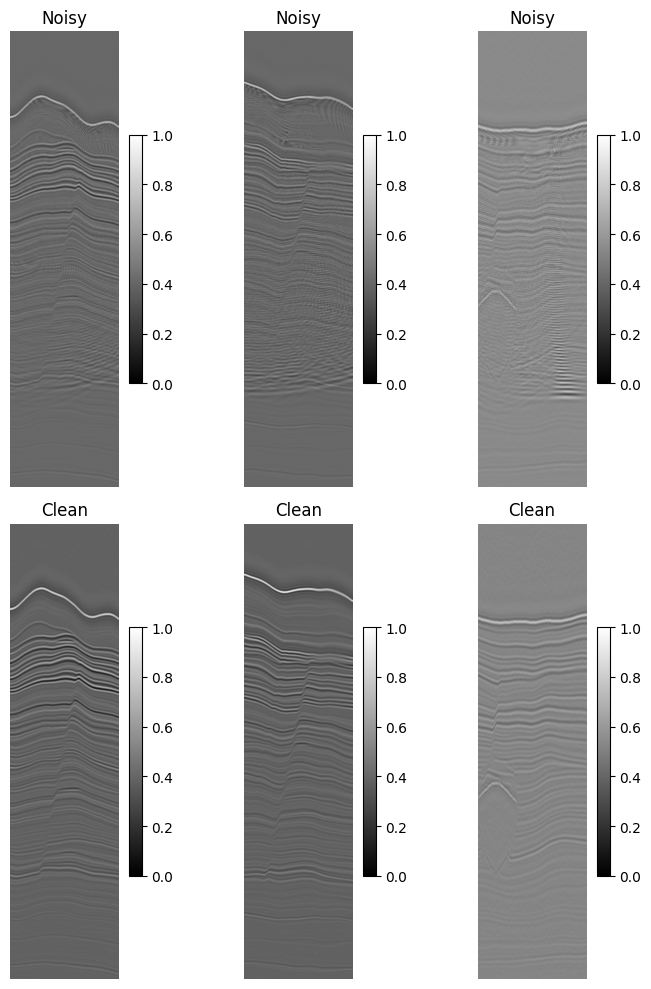

Epoch 1/70


2025-04-06 03:08:44.692625: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-06 03:08:56.858725: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 861 of 1000
2025-04-06 03:08:58.829841: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
I0000 00:00:1743889138.838306 2954660 service.cc:146] XLA service 0x797c2400f8b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743889138.838338 2954660 service.cc:154]   StreamExecutor device (0): NVIDIA RTX A4000, Compute Capability 8.6
2025-04-06 03:08:58.912084: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
W0000 00:00:1743889139.005241 2954660 assert_op.cc:38] Ignoring Assert operator compile_los

    120/Unknown 187s 649ms/step - loss: 0.1307

2025-04-06 03:11:51.744725: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 03:11:51.744799: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:11:51.744845: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
/home/bharath/miniconda3/envs/tf/lib/python3.12/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)
W0000 00:00:1743889324.001061 2954656 assert_op.cc:38] Ignoring Assert operator compile_loss/loss/SSIM/Assert/Assert
W0000 00:00:1743889324.001744 2954656 assert_op

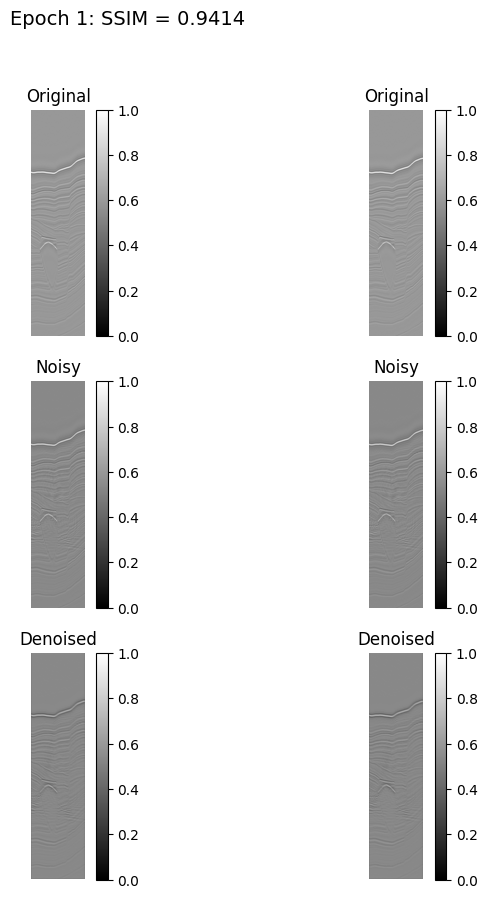

120/120 ━━━━━━━━━━━━━━━━━━━━ 234s 1s/step - loss: 0.1305 - val_loss: 0.0492
Epoch 2/70


2025-04-06 03:12:48.597187: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 866 of 1000
2025-04-06 03:12:50.556099: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - loss: 0.0704

2025-04-06 03:14:08.047832: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-04-06 03:14:24.404592: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:14:24.404665: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


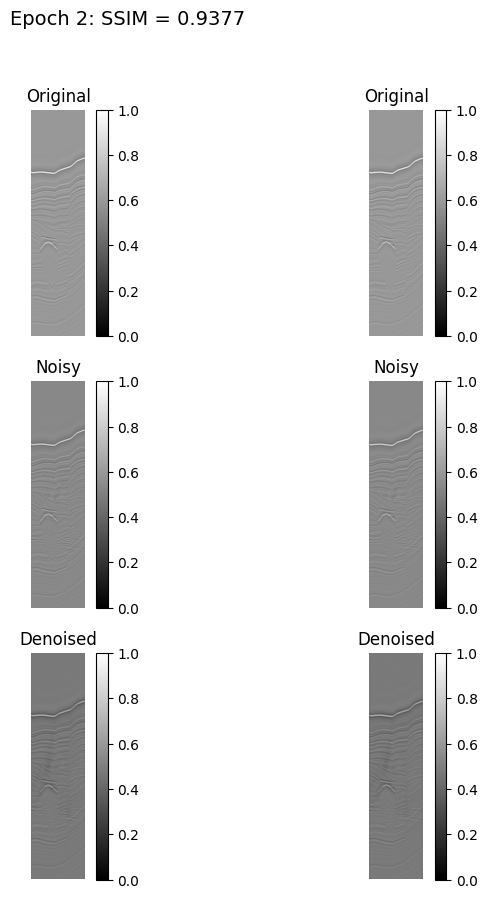

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 892ms/step - loss: 0.0704 - val_loss: 0.0590
Epoch 3/70


2025-04-06 03:14:47.345593: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 872 of 1000
2025-04-06 03:14:49.189360: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0532

2025-04-06 03:16:06.162443: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:16:22.499454: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 03:16:22.499539: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:16:22.499570: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


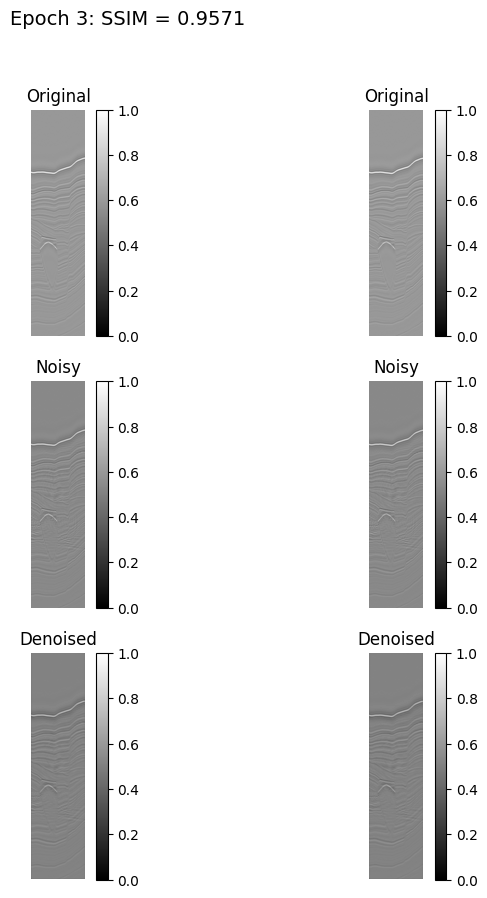

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0532 - val_loss: 0.0389
Epoch 4/70


2025-04-06 03:16:45.259696: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-06 03:16:47.093187: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 638ms/step - loss: 0.0430

2025-04-06 03:18:03.638003: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:18:20.136373: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:18:20.136431: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


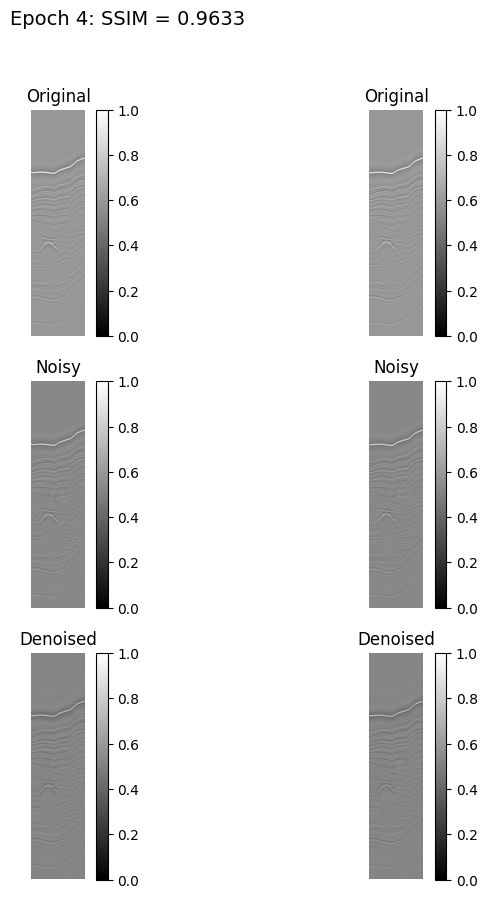

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 883ms/step - loss: 0.0430 - val_loss: 0.0311
Epoch 5/70


2025-04-06 03:18:42.846943: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 861 of 1000
2025-04-06 03:18:44.784131: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0362

2025-04-06 03:20:02.485226: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:20:19.076949: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:20:19.077024: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


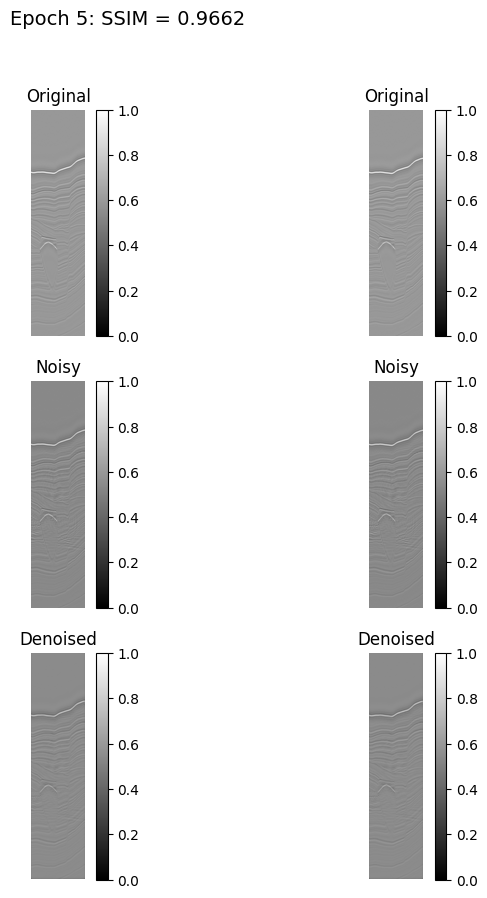

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 896ms/step - loss: 0.0362 - val_loss: 0.0272
Epoch 6/70


2025-04-06 03:20:42.009839: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 868 of 1000
2025-04-06 03:20:43.898265: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0333

2025-04-06 03:22:01.729557: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:22:01.729632: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:22:18.048220: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:22:18.048300: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:22:30.316449: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


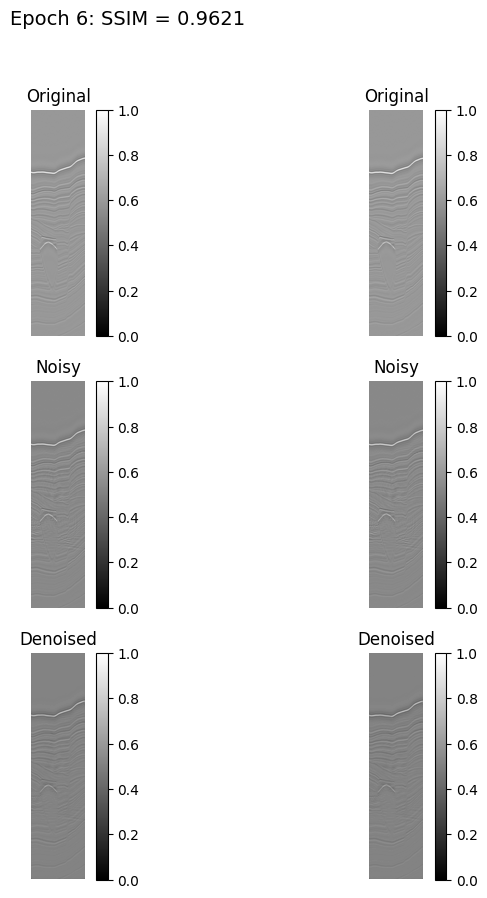

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0333 - val_loss: 0.0328
Epoch 7/70


2025-04-06 03:22:40.832688: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 871 of 1000
2025-04-06 03:22:42.718076: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0303

2025-04-06 03:23:59.988431: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:23:59.988508: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:24:16.302950: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:24:16.303027: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


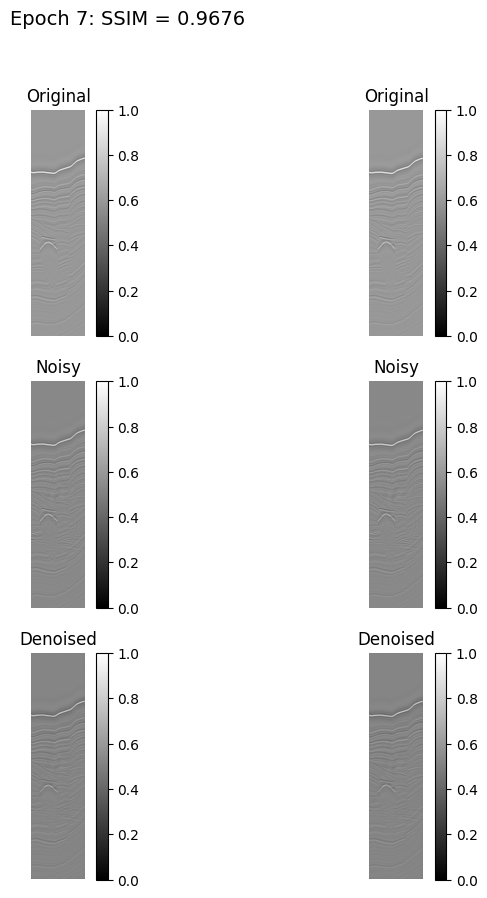

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0303 - val_loss: 0.0284
Epoch 8/70


2025-04-06 03:24:39.139304: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 867 of 1000
2025-04-06 03:24:41.038412: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - loss: 0.0278

2025-04-06 03:25:58.491088: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:25:58.491166: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:26:14.955534: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


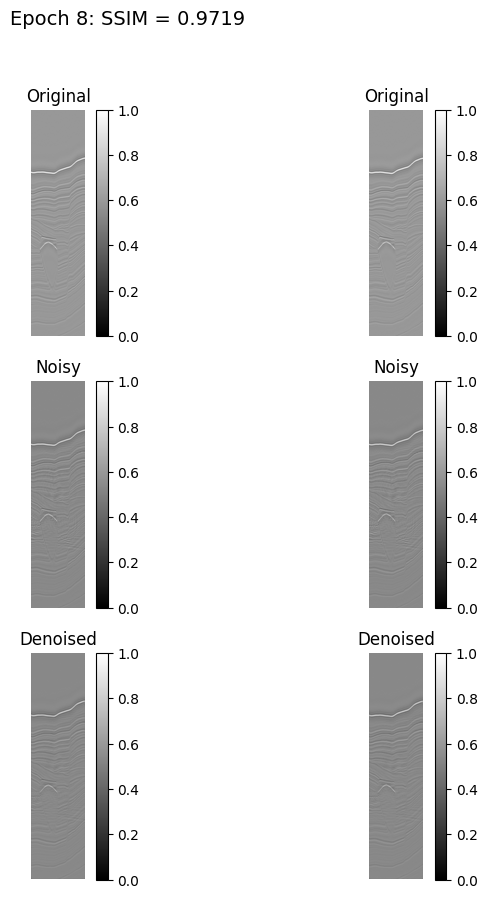

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 892ms/step - loss: 0.0278 - val_loss: 0.0248
Epoch 9/70


2025-04-06 03:26:37.856345: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 03:26:39.566128: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 639ms/step - loss: 0.0285

2025-04-06 03:27:56.244865: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:27:56.244938: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:28:12.794995: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:28:12.795064: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


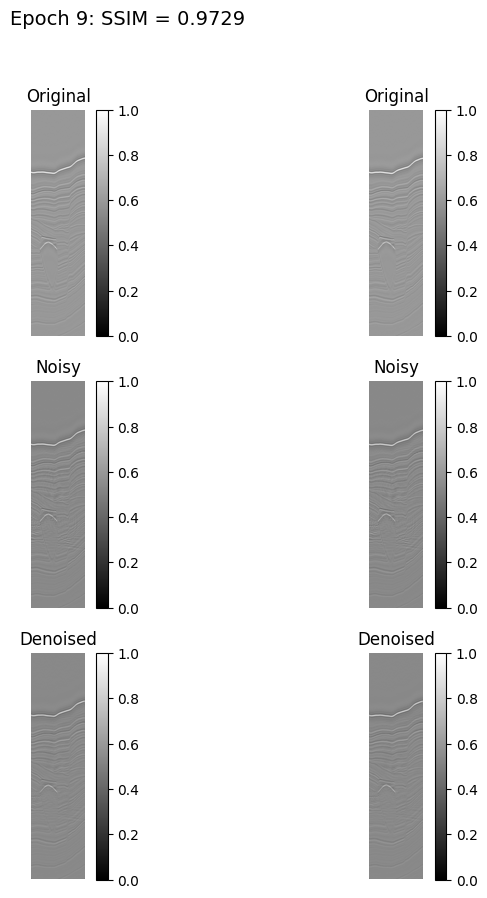

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0285 - val_loss: 0.0241
Epoch 10/70


2025-04-06 03:28:35.696153: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 868 of 1000
2025-04-06 03:28:37.604093: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0255

2025-04-06 03:30:10.901335: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:30:10.901417: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


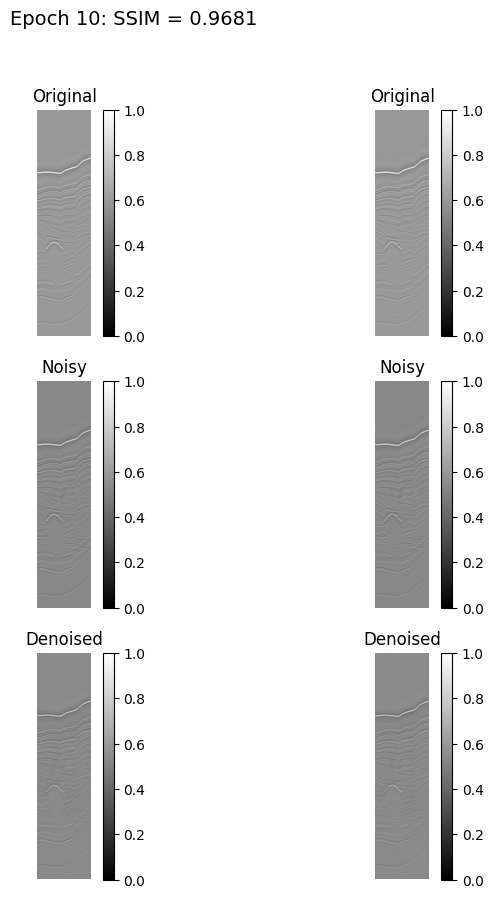

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0255 - val_loss: 0.0270
Epoch 11/70


2025-04-06 03:30:33.771607: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-06 03:30:35.557541: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0252

2025-04-06 03:31:52.411293: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:31:52.411376: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:32:08.665692: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:32:08.665765: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


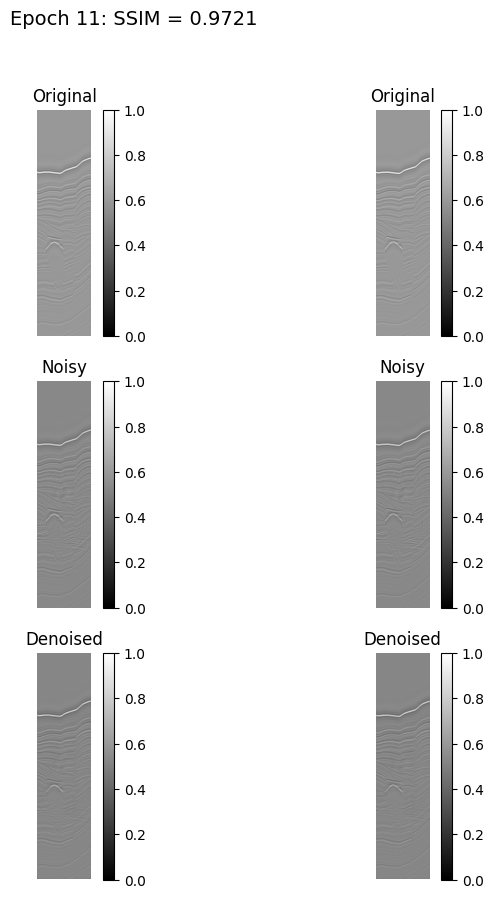

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 885ms/step - loss: 0.0252 - val_loss: 0.0255
Epoch 12/70


2025-04-06 03:32:31.537634: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 876 of 1000
2025-04-06 03:32:33.367099: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0233

2025-04-06 03:33:50.790309: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:33:50.790384: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:34:07.246898: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:34:07.246965: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


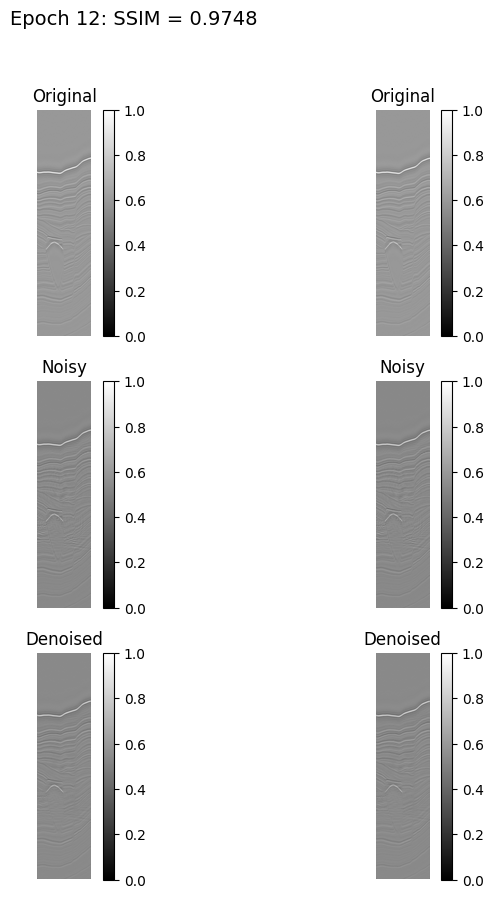

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0233 - val_loss: 0.0228
Epoch 13/70


2025-04-06 03:34:29.953052: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 871 of 1000
2025-04-06 03:34:31.848173: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0220

2025-04-06 03:35:48.614589: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_4]]
2025-04-06 03:36:05.060364: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:36:05.060442: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


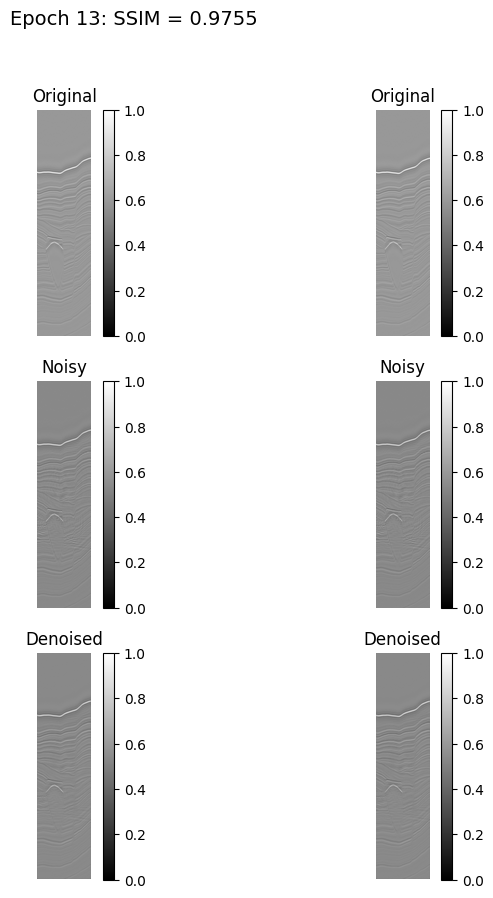

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0220 - val_loss: 0.0226
Epoch 14/70


2025-04-06 03:36:28.259746: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-06 03:36:30.117991: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0218

2025-04-06 03:37:47.035548: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:37:47.035626: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:38:03.408458: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:38:03.408536: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


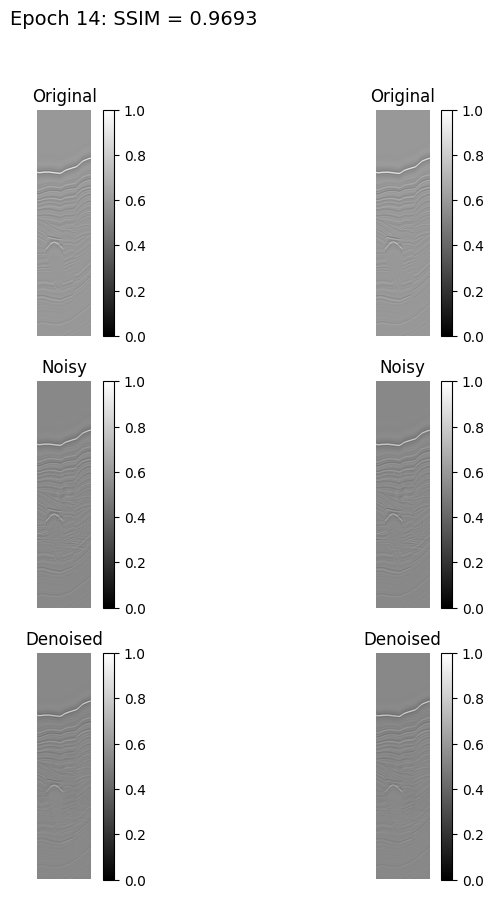

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0218 - val_loss: 0.0275
Epoch 15/70


2025-04-06 03:38:26.229612: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 872 of 1000
2025-04-06 03:38:28.097054: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0207

2025-04-06 03:39:45.773147: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:39:45.773223: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


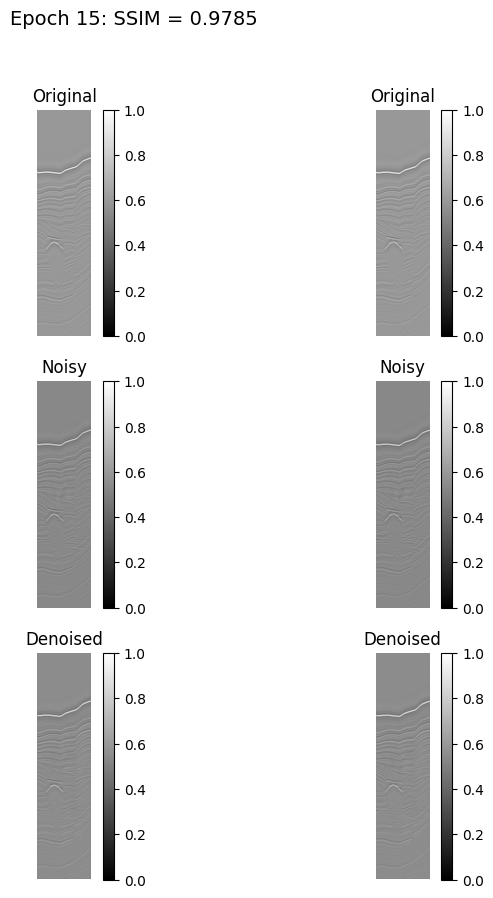

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 892ms/step - loss: 0.0207 - val_loss: 0.0200
Epoch 16/70


2025-04-06 03:40:24.837805: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 877 of 1000
2025-04-06 03:40:26.656466: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0209

2025-04-06 03:42:01.343654: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:42:01.343730: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


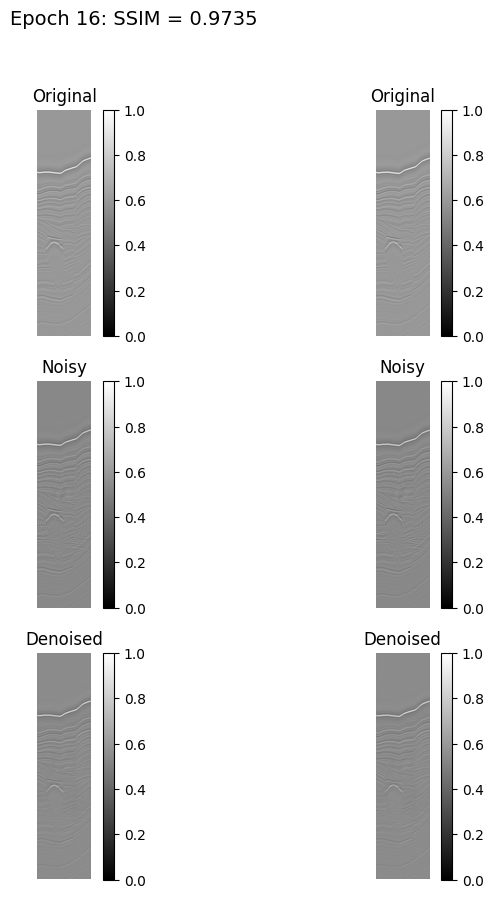

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0209 - val_loss: 0.0235
Epoch 17/70


2025-04-06 03:42:24.213491: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 863 of 1000
2025-04-06 03:42:26.150467: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0191

2025-04-06 03:43:43.209411: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:43:43.209483: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:43:59.560591: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:43:59.560671: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


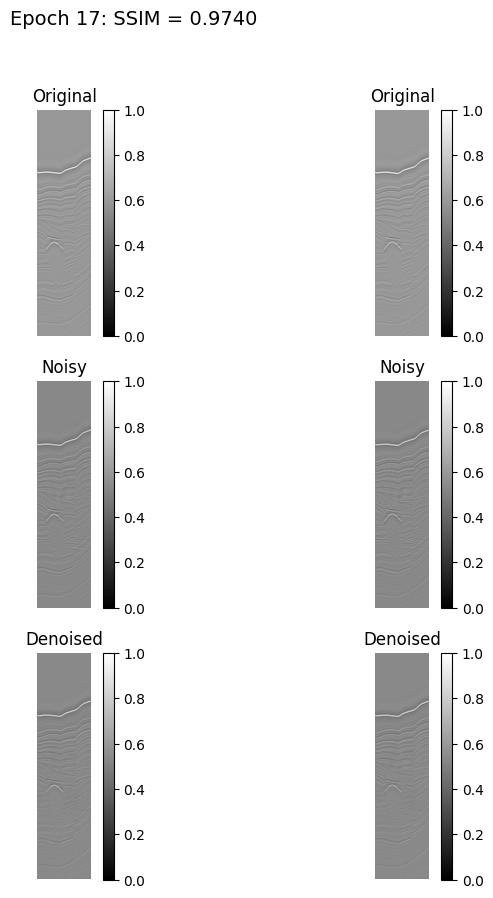

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0191 - val_loss: 0.0237
Epoch 18/70


2025-04-06 03:44:22.682559: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 03:44:24.591989: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0186

2025-04-06 03:45:42.460899: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:45:42.460977: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:45:58.913217: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:45:58.913287: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


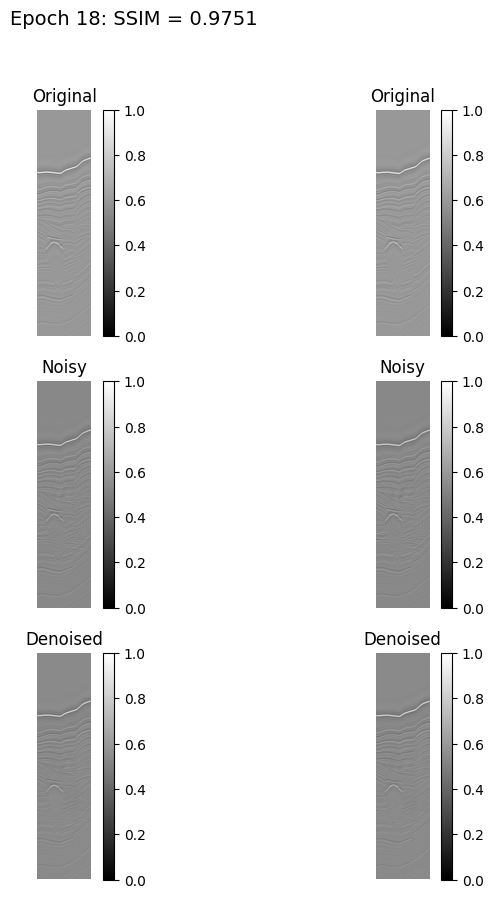

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0186 - val_loss: 0.0228
Epoch 19/70


2025-04-06 03:46:21.752438: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 863 of 1000
2025-04-06 03:46:23.706893: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 658ms/step - loss: 0.0182

2025-04-06 03:47:42.650661: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:47:42.650737: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:47:59.017772: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:47:59.017870: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


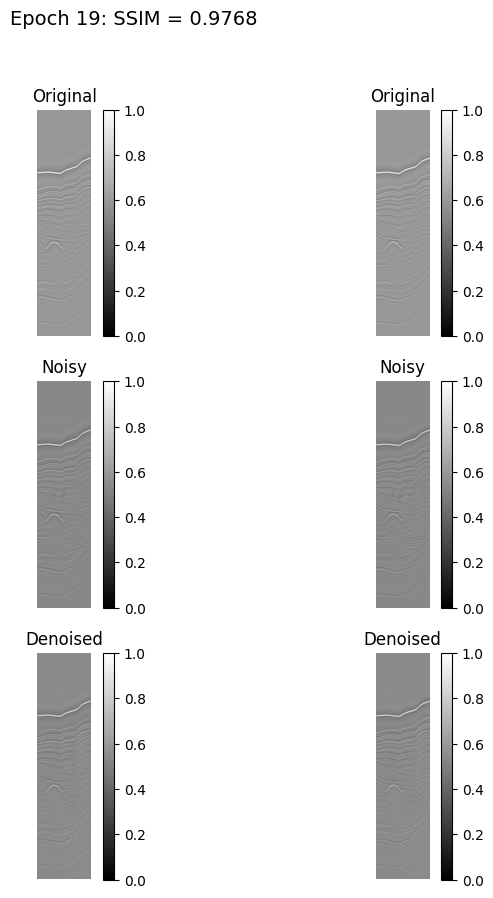

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 904ms/step - loss: 0.0182 - val_loss: 0.0214
Epoch 20/70


2025-04-06 03:48:21.991518: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-06 03:48:23.776025: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0177

2025-04-06 03:49:40.927496: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:49:57.375479: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:49:57.375556: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


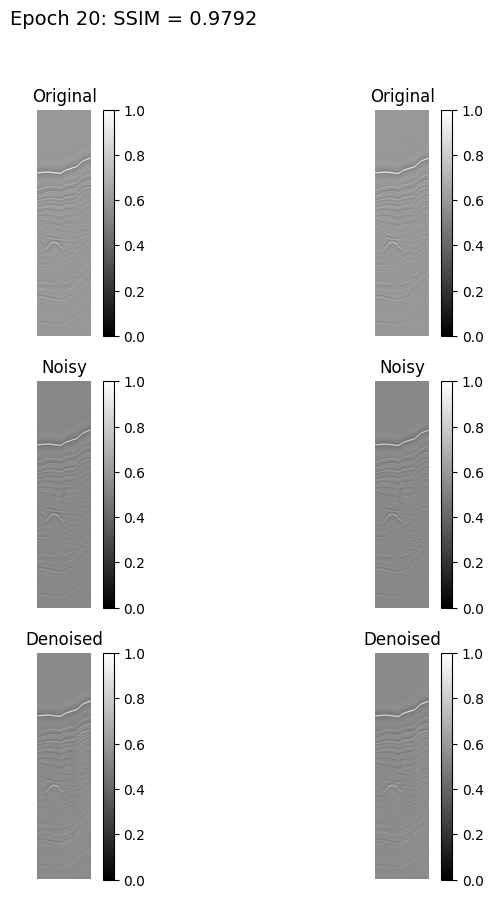

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0177 - val_loss: 0.0198
Epoch 21/70


2025-04-06 03:50:20.012228: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 843 of 1000
2025-04-06 03:50:22.075085: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0171

2025-04-06 03:51:38.857873: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:51:38.857953: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:51:55.198358: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:51:55.198433: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


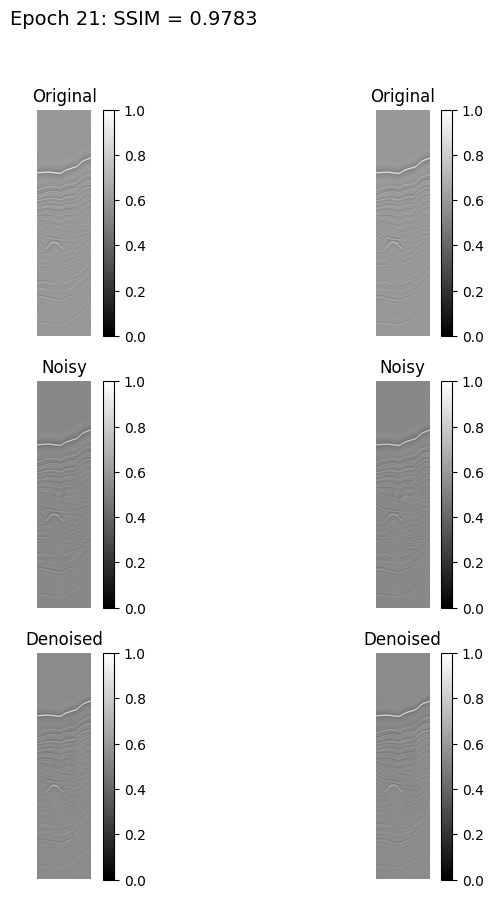

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0171 - val_loss: 0.0206
Epoch 22/70


2025-04-06 03:52:18.226819: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 871 of 1000
2025-04-06 03:52:20.072842: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 658ms/step - loss: 0.0176

2025-04-06 03:53:55.644000: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:53:55.644069: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


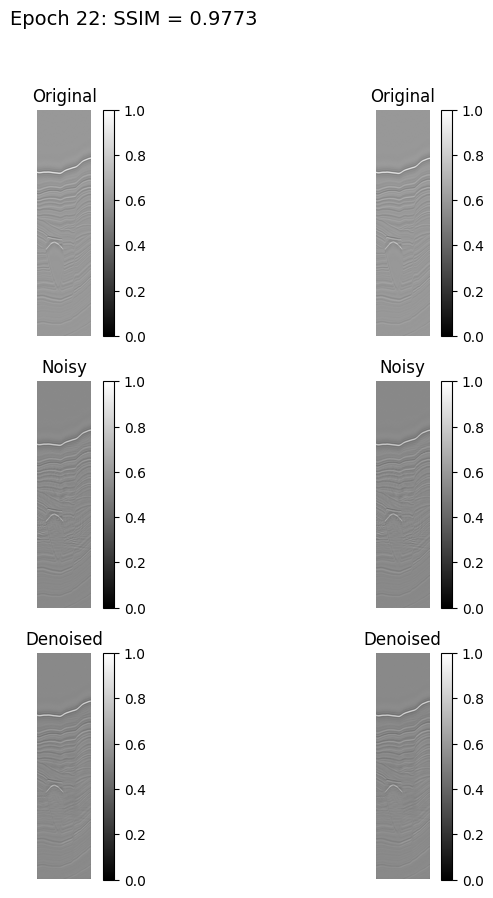

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 905ms/step - loss: 0.0176 - val_loss: 0.0213
Epoch 23/70


2025-04-06 03:54:18.476282: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 03:54:20.366897: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0166

2025-04-06 03:55:37.576970: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:55:53.971644: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:55:53.971719: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


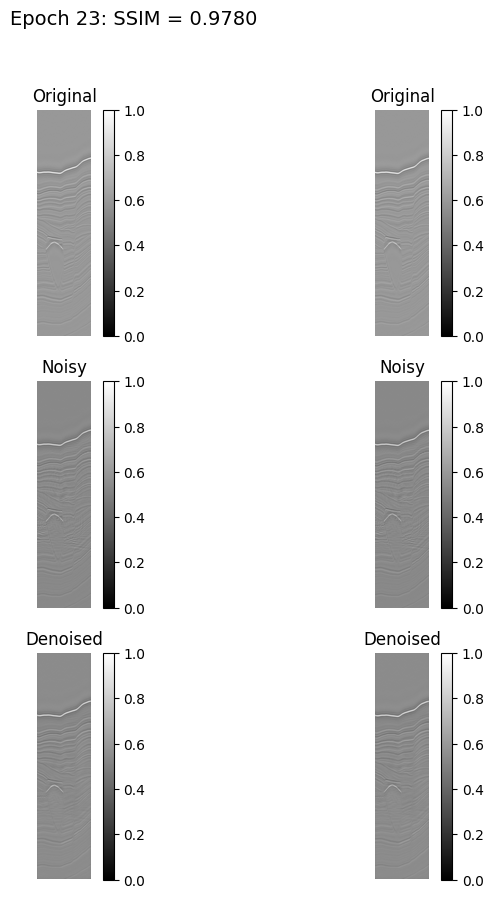

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0166 - val_loss: 0.0203
Epoch 24/70


2025-04-06 03:56:16.808501: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 03:56:18.538830: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0163

2025-04-06 03:57:35.535189: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:57:35.535231: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:57:51.944712: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:57:51.944790: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


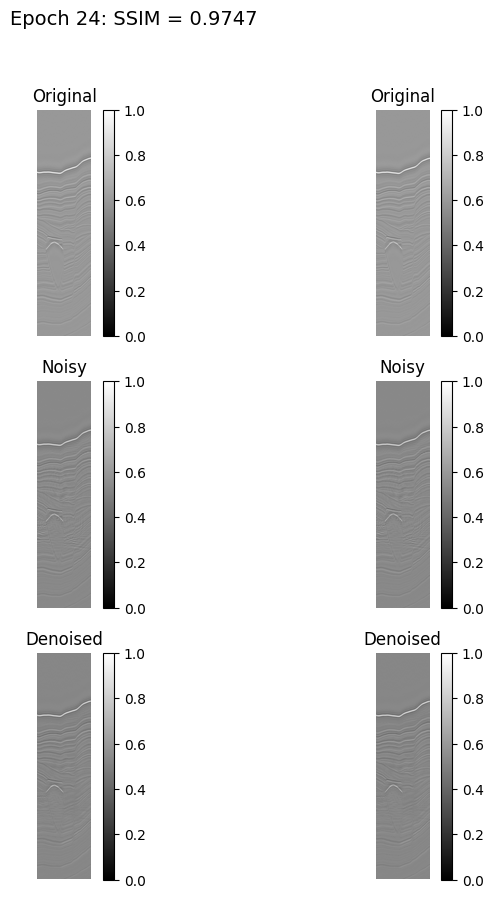

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0163 - val_loss: 0.0236
Epoch 25/70


2025-04-06 03:58:14.726147: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 03:58:16.513886: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0154

2025-04-06 03:59:33.306112: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:59:33.306189: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 03:59:49.701797: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 03:59:49.701892: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


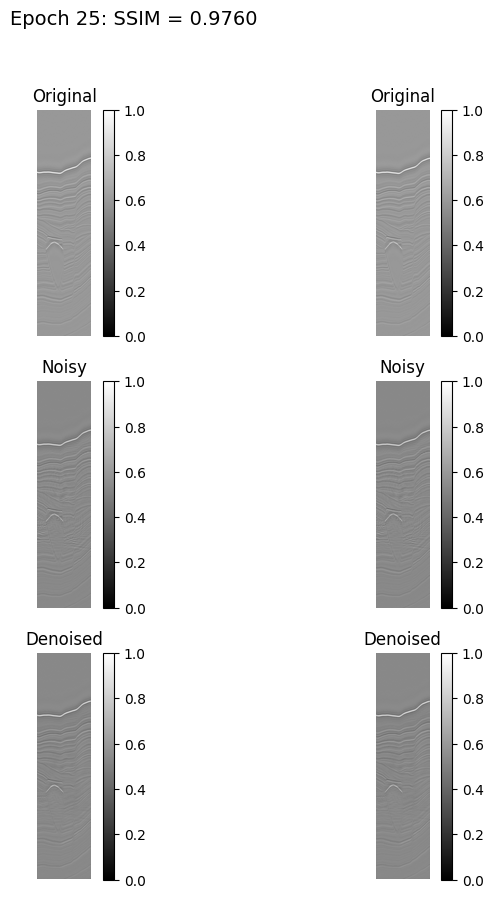

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0154 - val_loss: 0.0224
Epoch 26/70


2025-04-06 04:00:12.645124: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 04:00:14.526343: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 651ms/step - loss: 0.0155

2025-04-06 04:01:32.591857: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-04-06 04:01:32.591932: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:01:32.591966: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:01:48.866097: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


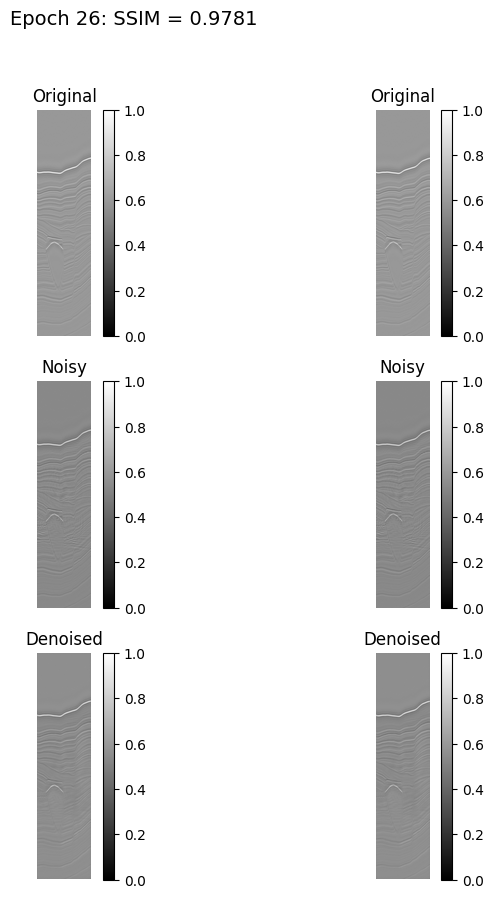

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 896ms/step - loss: 0.0155 - val_loss: 0.0205
Epoch 27/70


2025-04-06 04:02:11.801738: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 879 of 1000
2025-04-06 04:02:13.633529: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0153

2025-04-06 04:03:31.267214: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:03:31.267300: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:03:47.583234: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:03:47.583301: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


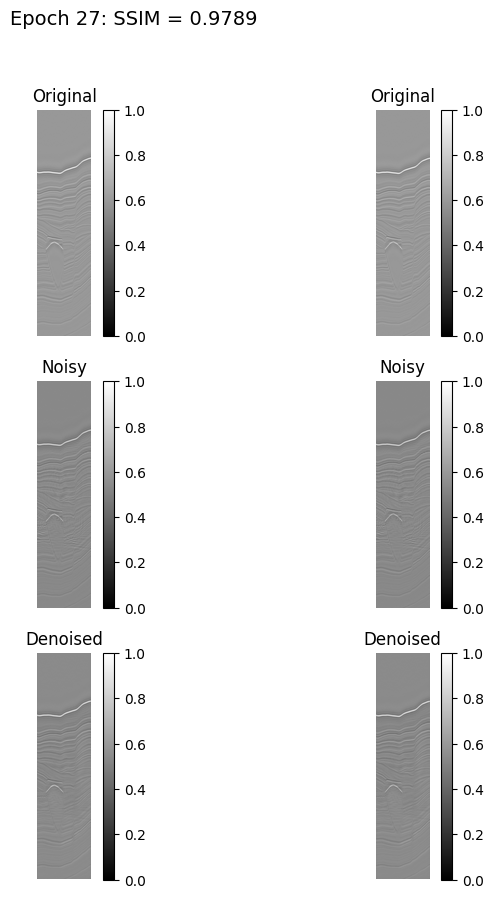

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 892ms/step - loss: 0.0153 - val_loss: 0.0200
Epoch 28/70


2025-04-06 04:04:10.411074: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 871 of 1000
2025-04-06 04:04:12.277463: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0150

2025-04-06 04:05:29.707431: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:05:46.116063: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:05:46.116138: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


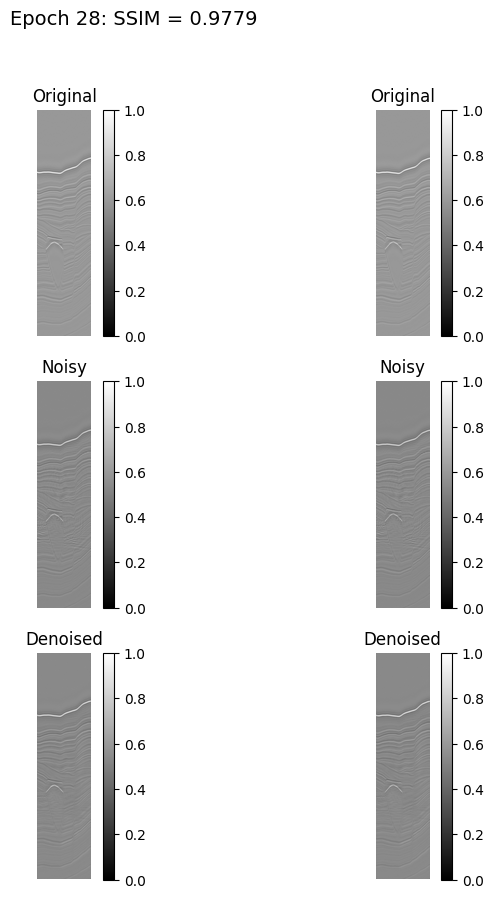

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0150 - val_loss: 0.0207
Epoch 29/70


2025-04-06 04:06:08.887679: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 877 of 1000
2025-04-06 04:06:10.713619: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0146

2025-04-06 04:07:28.296897: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:07:28.296972: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:07:44.881979: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


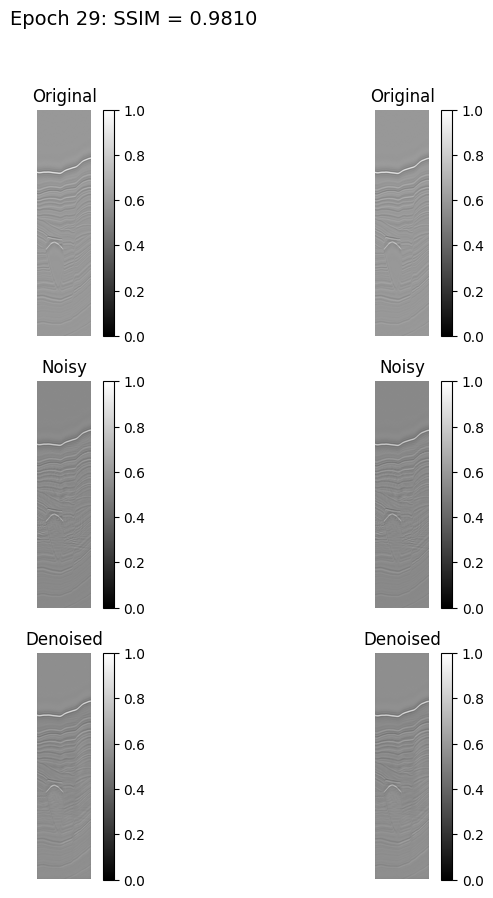

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0146 - val_loss: 0.0180
Epoch 30/70


2025-04-06 04:08:07.903072: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 868 of 1000
2025-04-06 04:08:09.796266: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 639ms/step - loss: 0.0142

2025-04-06 04:09:26.424184: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:09:26.424261: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:09:42.748440: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:09:42.748514: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


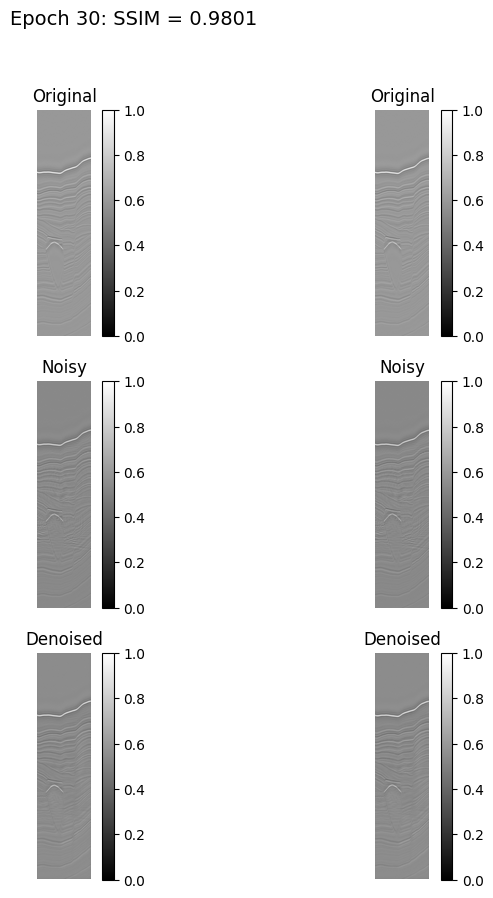

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 883ms/step - loss: 0.0142 - val_loss: 0.0190
Epoch 31/70


2025-04-06 04:10:05.574450: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-06 04:10:07.424148: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0140

2025-04-06 04:11:24.818708: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:11:41.199191: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:11:41.199229: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


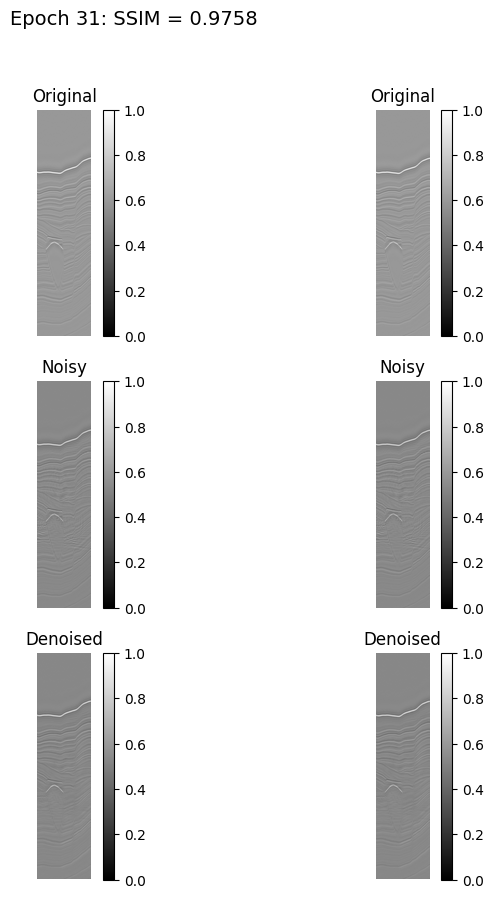

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 891ms/step - loss: 0.0140 - val_loss: 0.0224
Epoch 32/70


2025-04-06 04:12:04.067277: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 04:12:05.936834: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0141

2025-04-06 04:13:39.653394: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:13:39.653470: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


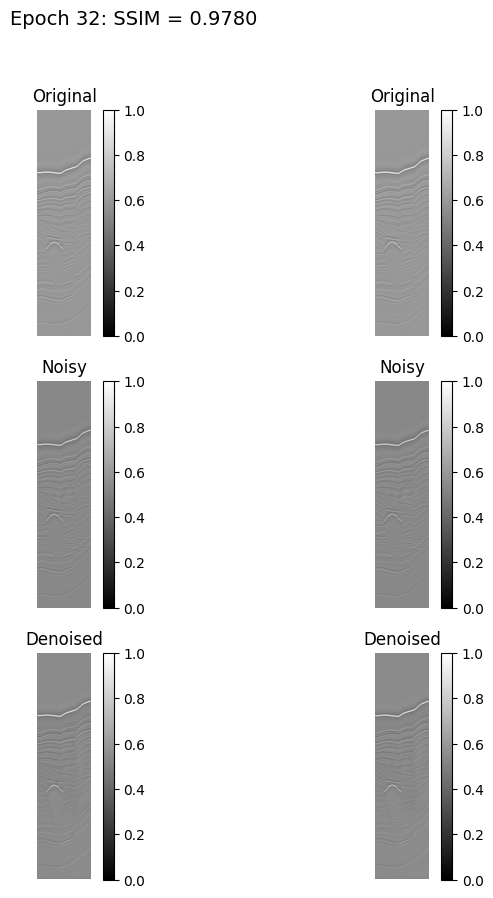

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0141 - val_loss: 0.0207
Epoch 33/70


2025-04-06 04:14:02.395647: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 861 of 1000
2025-04-06 04:14:04.356919: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0140

2025-04-06 04:15:37.815518: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:15:37.815598: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


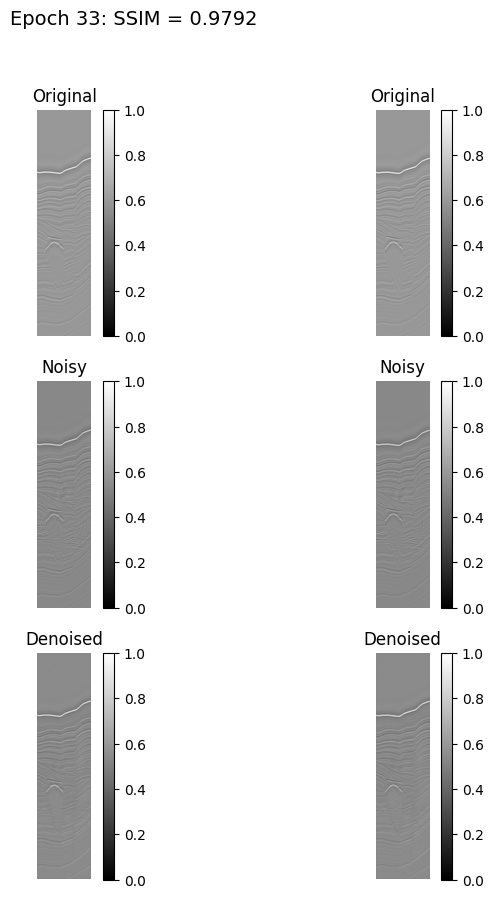

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0140 - val_loss: 0.0196
Epoch 34/70


2025-04-06 04:16:00.610420: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 04:16:02.402022: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0134

2025-04-06 04:17:19.191127: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:17:19.191202: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:17:35.648008: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:17:35.648077: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


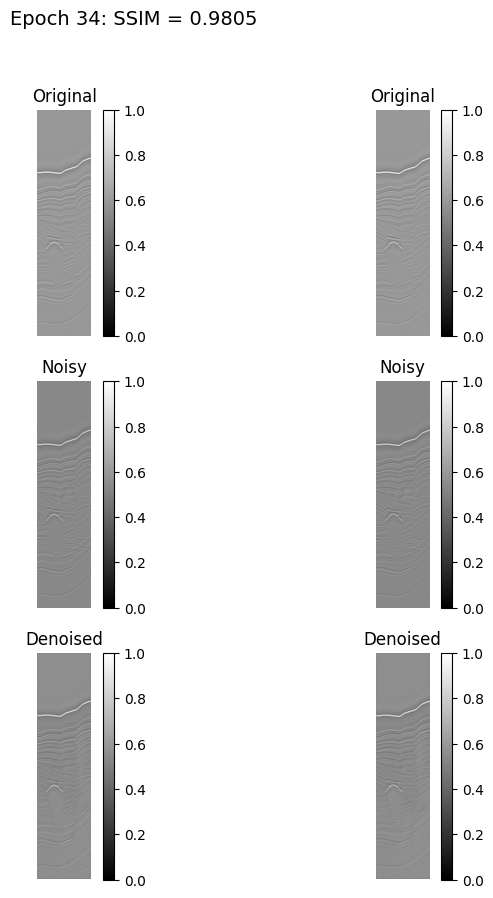

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0134 - val_loss: 0.0181
Epoch 35/70


2025-04-06 04:17:58.634567: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 04:18:00.502771: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0133

2025-04-06 04:19:17.803177: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:19:17.803250: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:19:34.212215: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:19:34.212286: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


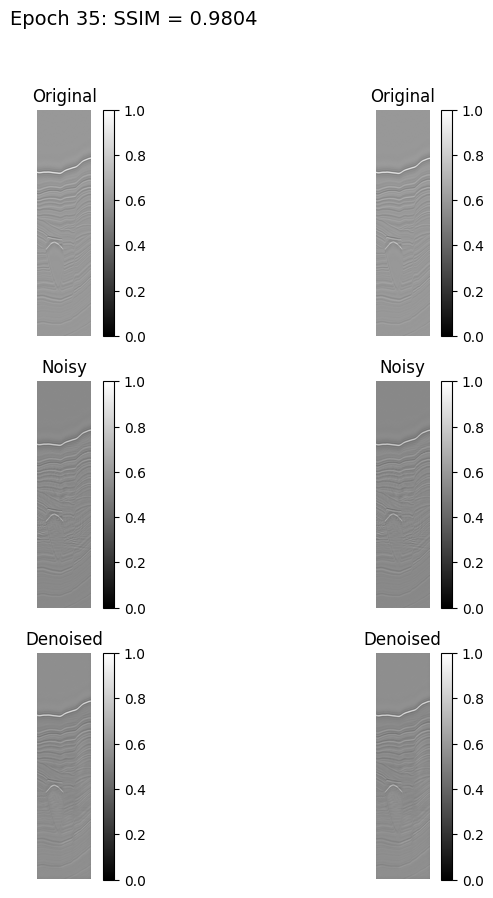

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0133 - val_loss: 0.0183
Epoch 36/70


2025-04-06 04:19:56.956774: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 855 of 1000
2025-04-06 04:19:58.943612: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0133

2025-04-06 04:21:32.508886: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:21:32.508955: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


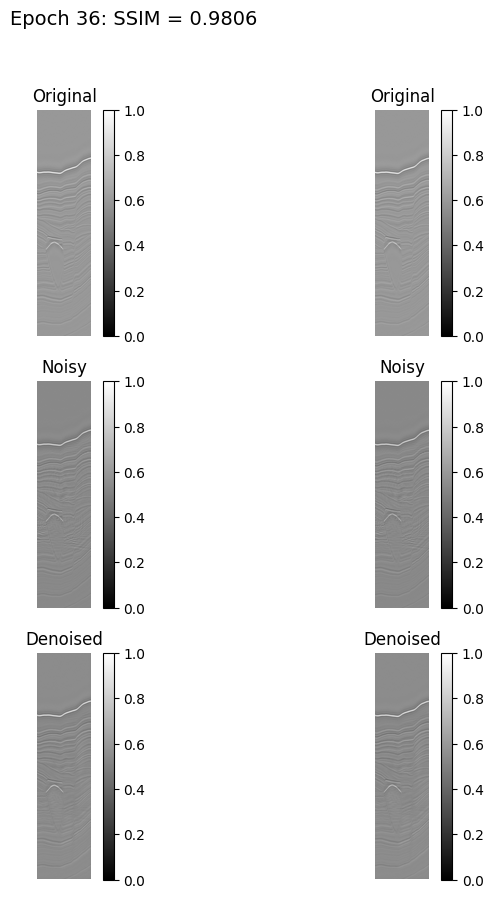

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0133 - val_loss: 0.0184
Epoch 37/70


2025-04-06 04:21:55.372731: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-06 04:21:57.153089: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - loss: 0.0127

2025-04-06 04:23:15.314930: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:23:15.315007: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:23:31.958504: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:23:31.958559: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


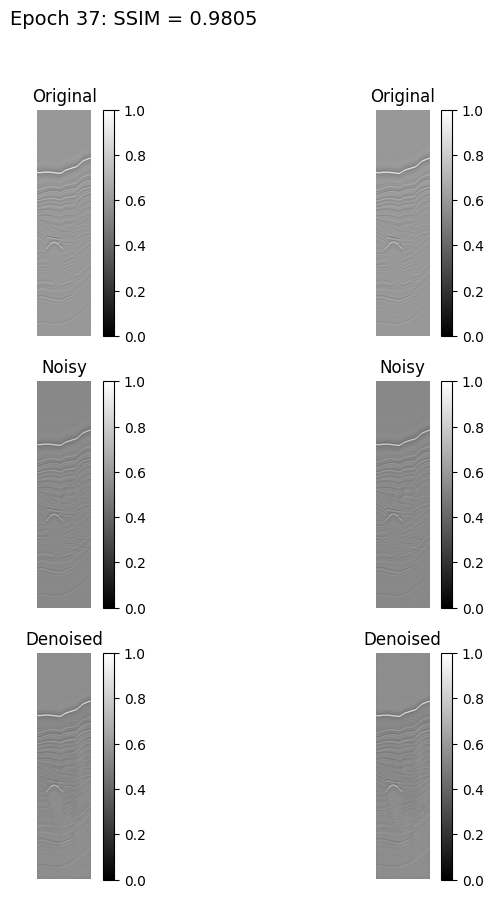

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0127 - val_loss: 0.0183
Epoch 38/70


2025-04-06 04:23:54.619024: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-06 04:23:56.493997: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0125

2025-04-06 04:25:29.696077: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:25:29.696156: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


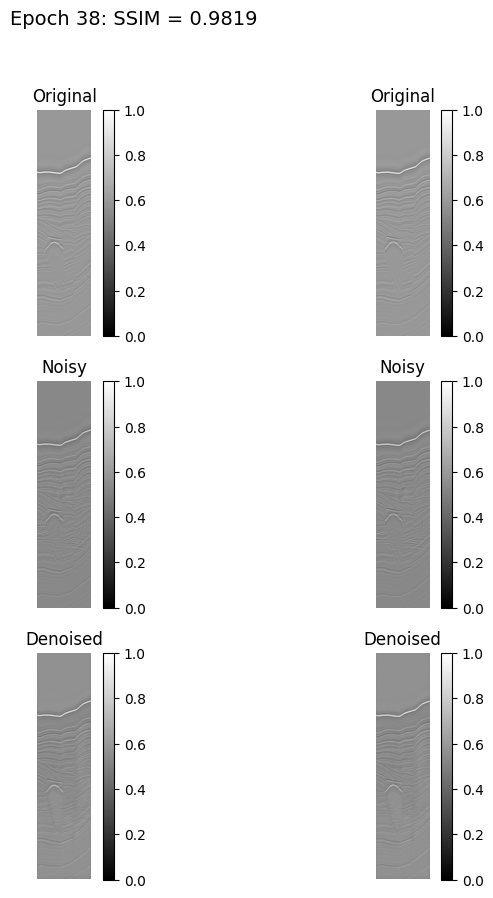

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0125 - val_loss: 0.0169
Epoch 39/70


2025-04-06 04:25:52.721710: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 865 of 1000
2025-04-06 04:25:54.663960: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0126

2025-04-06 04:27:11.466923: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:27:27.791083: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:27:27.791155: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


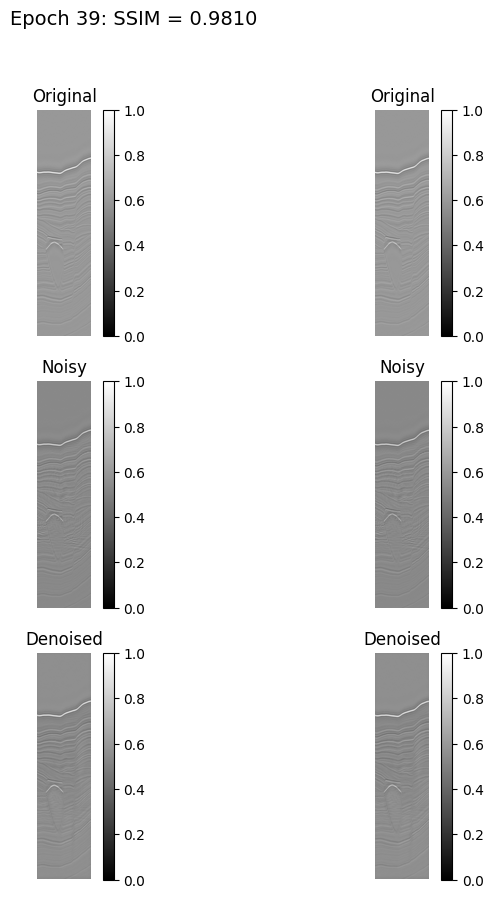

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 884ms/step - loss: 0.0126 - val_loss: 0.0177
Epoch 40/70


2025-04-06 04:27:50.547264: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-06 04:27:52.411766: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0126

2025-04-06 04:29:10.283903: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:29:10.283978: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:29:26.964010: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:29:26.964083: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


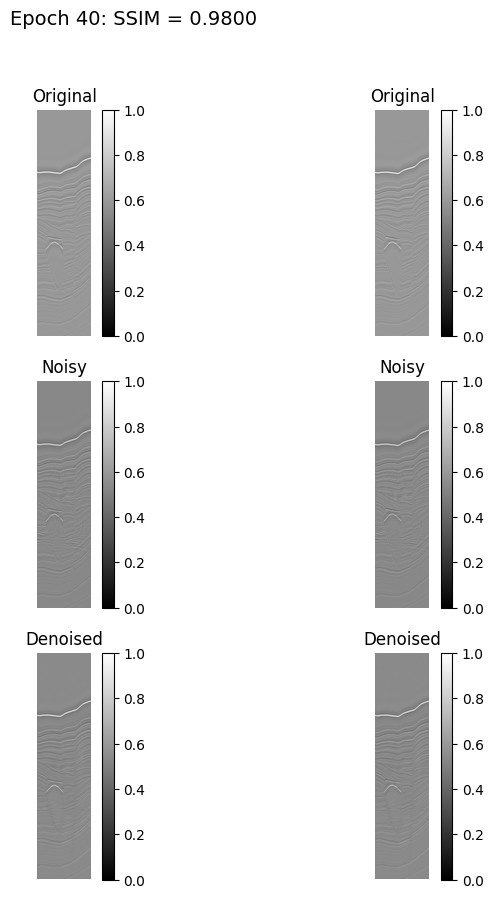

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 896ms/step - loss: 0.0126 - val_loss: 0.0190
Epoch 41/70


2025-04-06 04:29:49.642752: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 858 of 1000
2025-04-06 04:29:51.637533: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0122

2025-04-06 04:31:08.739888: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:31:08.739961: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:31:25.123539: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


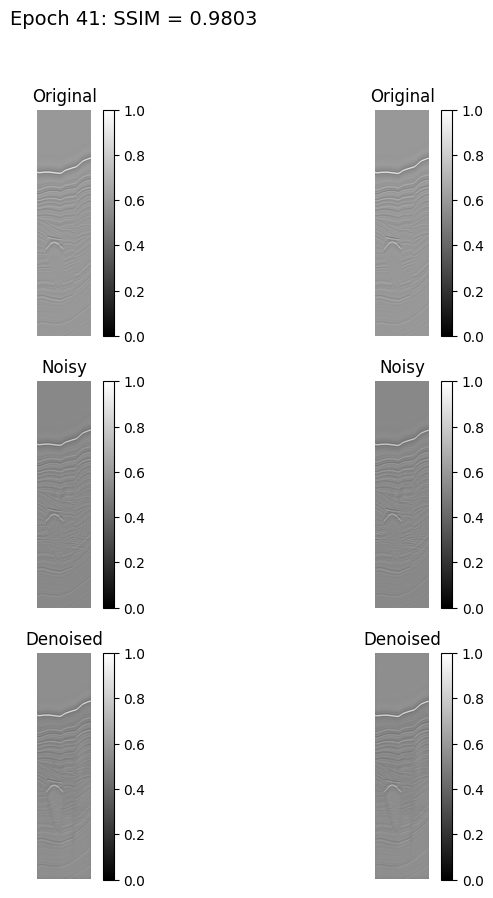

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0122 - val_loss: 0.0180
Epoch 42/70


2025-04-06 04:31:48.130436: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-06 04:31:49.929637: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0119

2025-04-06 04:33:06.862644: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:33:06.862732: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:33:23.211285: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:33:23.211363: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


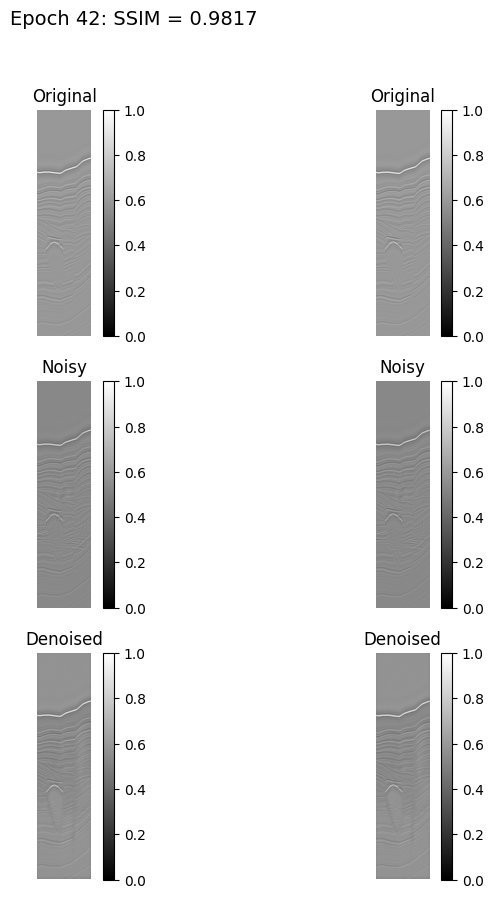

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0119 - val_loss: 0.0164
Epoch 43/70


2025-04-06 04:33:46.369618: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 890 of 1000
2025-04-06 04:33:48.099648: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0121

2025-04-06 04:35:05.272451: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:35:05.272526: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:35:21.794337: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:35:21.794411: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


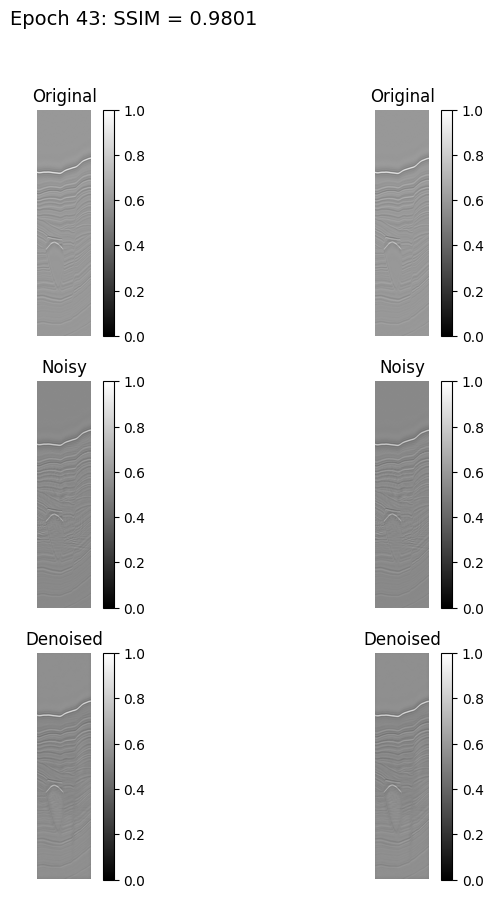

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0121 - val_loss: 0.0184
Epoch 44/70


2025-04-06 04:35:44.672082: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 848 of 1000
2025-04-06 04:35:46.735957: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 658ms/step - loss: 0.0115

2025-04-06 04:37:05.688977: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:37:05.689045: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:37:22.288466: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:37:22.288539: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


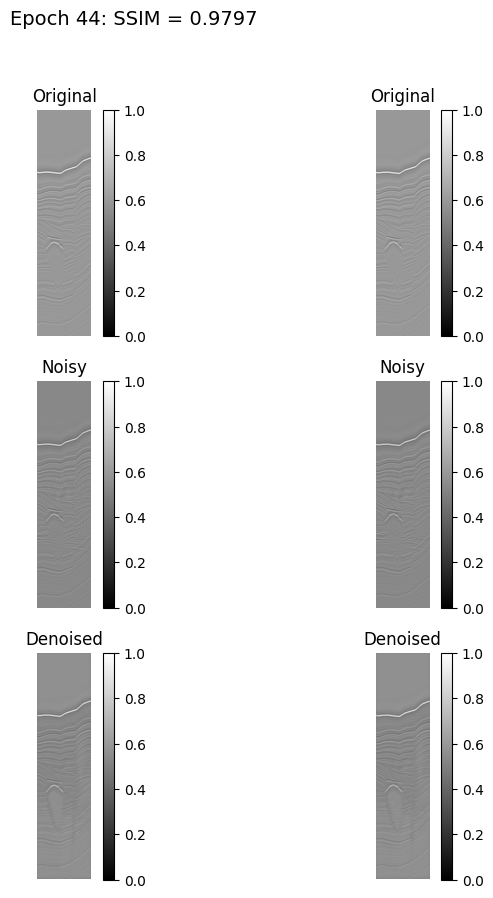

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 905ms/step - loss: 0.0115 - val_loss: 0.0185
Epoch 45/70


2025-04-06 04:37:45.105007: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 860 of 1000
2025-04-06 04:37:47.062430: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0116

2025-04-06 04:39:04.272233: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:39:04.272306: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:39:20.799148: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


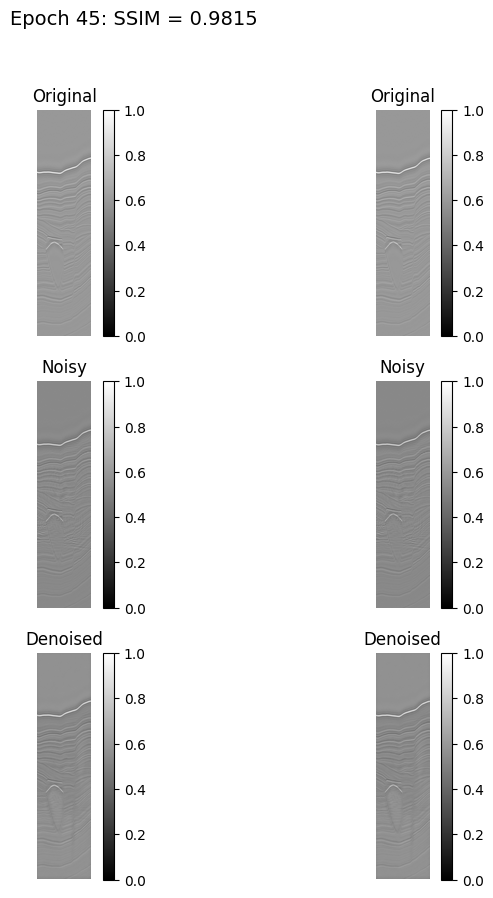

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0116 - val_loss: 0.0168
Epoch 46/70


2025-04-06 04:39:43.414427: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-06 04:39:45.281497: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0115

2025-04-06 04:41:02.284657: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:41:02.284724: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:41:18.550096: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


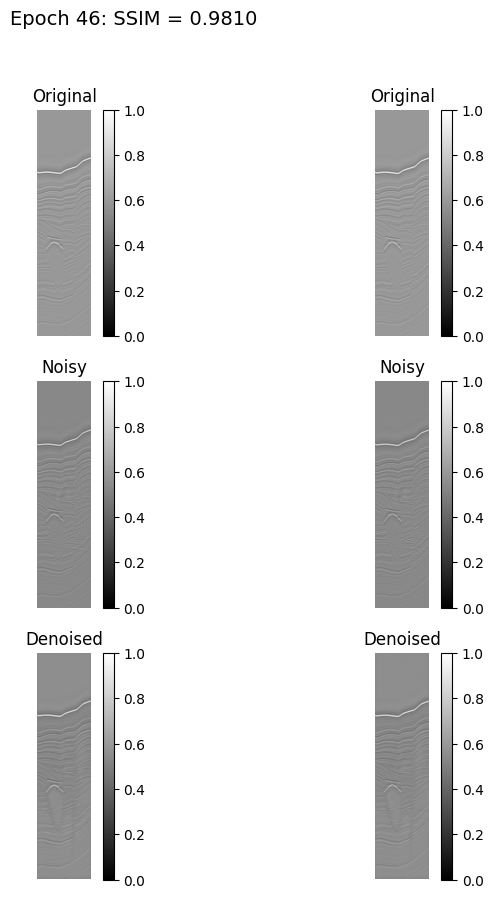

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0115 - val_loss: 0.0176
Epoch 47/70


2025-04-06 04:41:41.457026: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-06 04:41:43.237754: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - loss: 0.0115

2025-04-06 04:43:01.411533: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:43:01.411604: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:43:17.803907: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


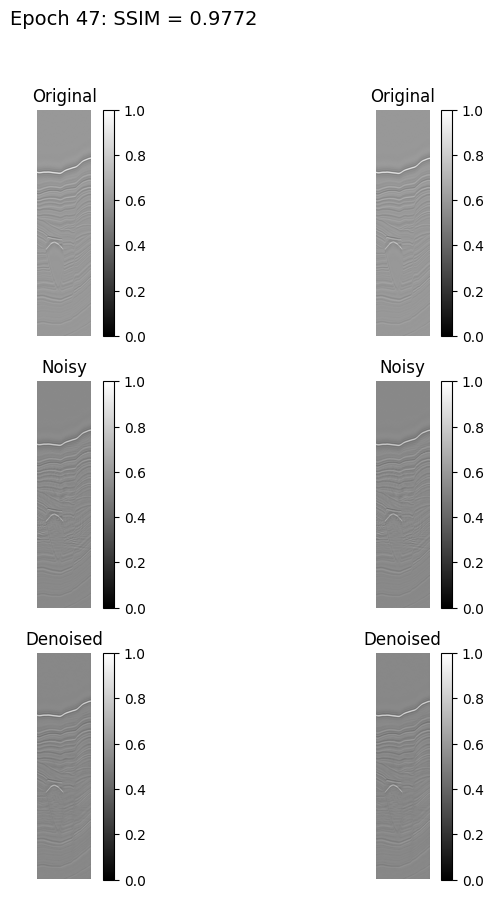

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 897ms/step - loss: 0.0115 - val_loss: 0.0211
Epoch 48/70


2025-04-06 04:43:40.606557: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-06 04:43:42.411197: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0115

2025-04-06 04:44:59.373137: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:44:59.373214: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:45:15.750355: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:45:15.750392: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


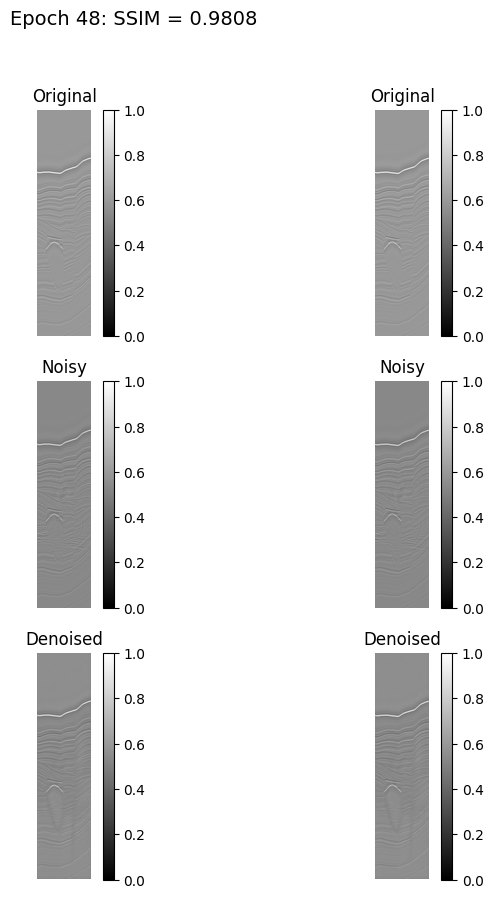

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0115 - val_loss: 0.0179
Epoch 49/70


2025-04-06 04:45:38.738864: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 861 of 1000
2025-04-06 04:45:40.712090: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0112

2025-04-06 04:47:15.033529: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:47:15.033607: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


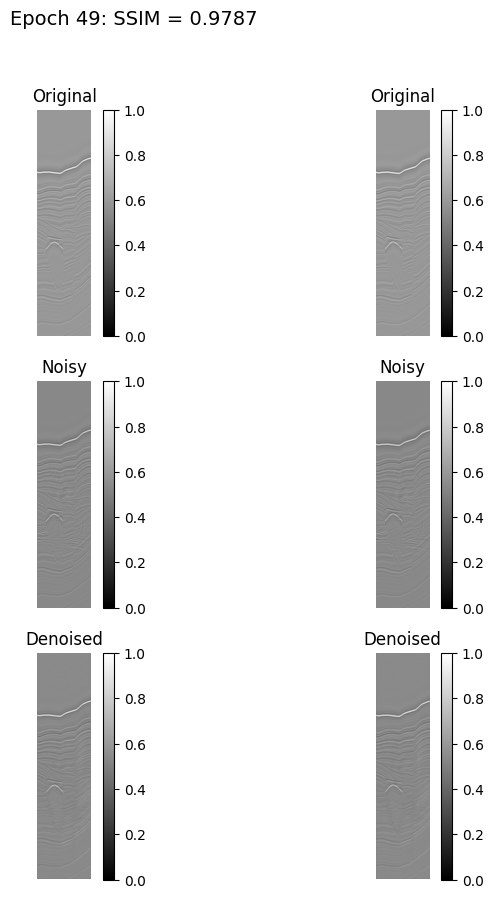

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0112 - val_loss: 0.0195
Epoch 50/70


2025-04-06 04:47:37.871368: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 848 of 1000
2025-04-06 04:47:39.947049: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0114

2025-04-06 04:48:56.952059: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:48:56.952142: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:49:13.467296: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:49:13.467369: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


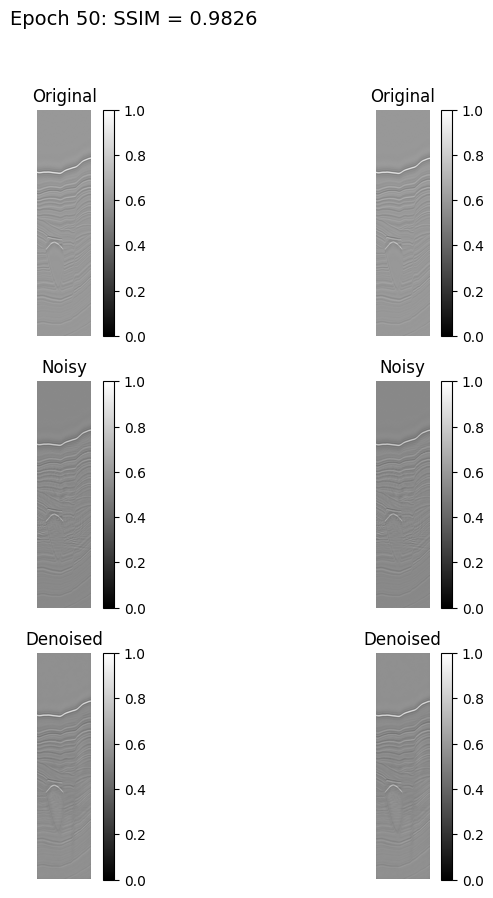

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 890ms/step - loss: 0.0114 - val_loss: 0.0166
Epoch 51/70


2025-04-06 04:49:36.530151: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 04:49:38.422038: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0107

2025-04-06 04:50:55.289171: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:51:11.759468: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-06 04:51:11.759528: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:51:11.759557: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


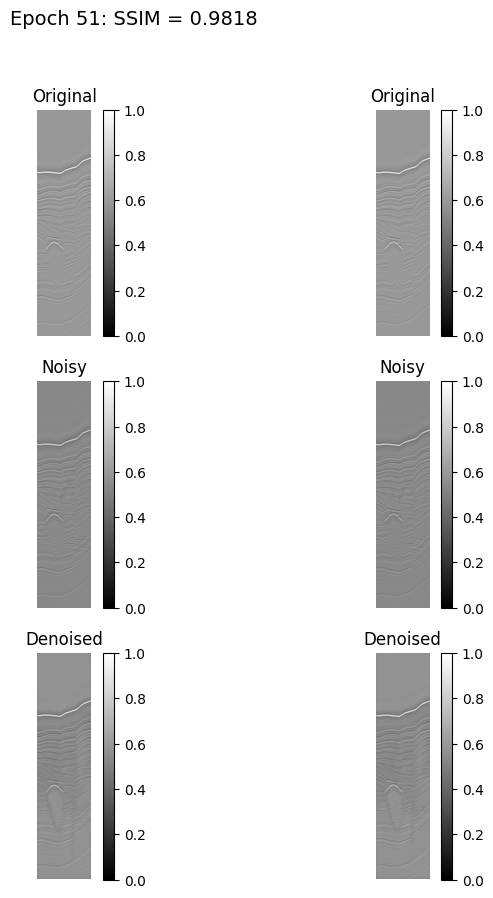

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0107 - val_loss: 0.0166
Epoch 52/70


2025-04-06 04:51:34.574969: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 871 of 1000
2025-04-06 04:51:36.419002: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0113

2025-04-06 04:52:53.997204: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:53:10.341985: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:53:10.342044: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


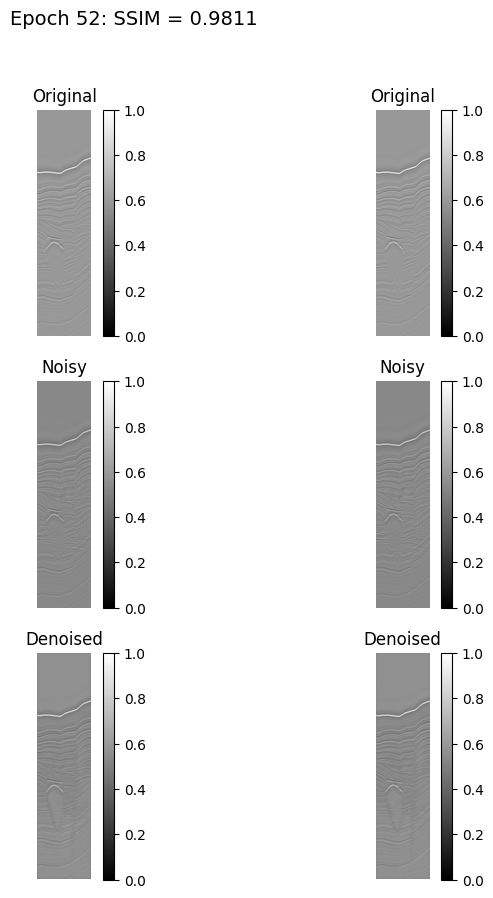

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0113 - val_loss: 0.0173
Epoch 53/70


2025-04-06 04:53:33.349053: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 04:53:35.147621: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0105

2025-04-06 04:55:08.526443: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:55:08.526519: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


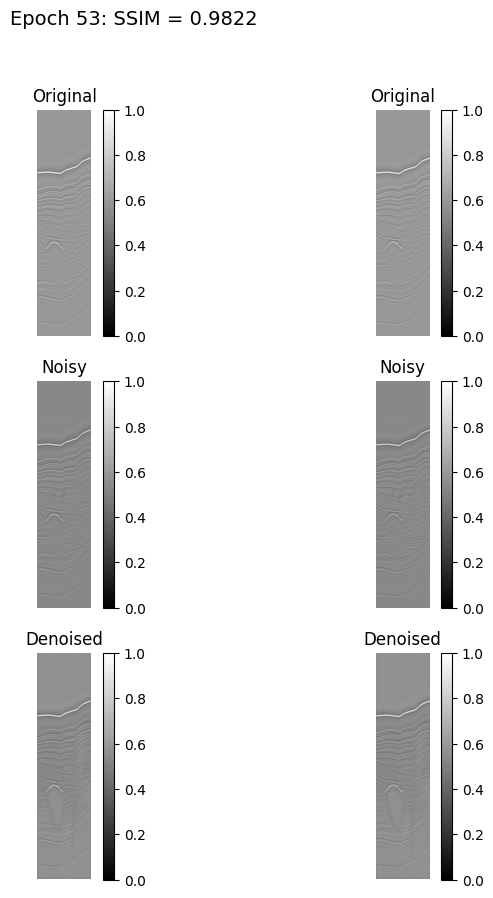

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0105 - val_loss: 0.0162
Epoch 54/70


2025-04-06 04:55:31.400987: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 863 of 1000
2025-04-06 04:55:33.349797: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - loss: 0.0106

2025-04-06 04:56:50.902083: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:56:50.902157: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:57:07.339347: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:57:07.339429: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


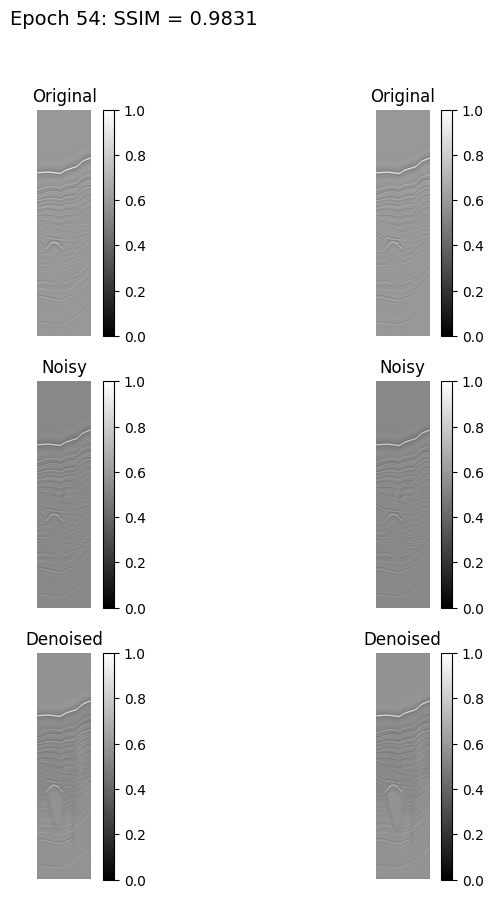

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0106 - val_loss: 0.0157
Epoch 55/70


2025-04-06 04:57:30.316623: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-06 04:57:32.094946: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 639ms/step - loss: 0.0103

2025-04-06 04:58:48.773771: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:58:48.773863: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 04:59:05.227611: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 04:59:05.227690: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


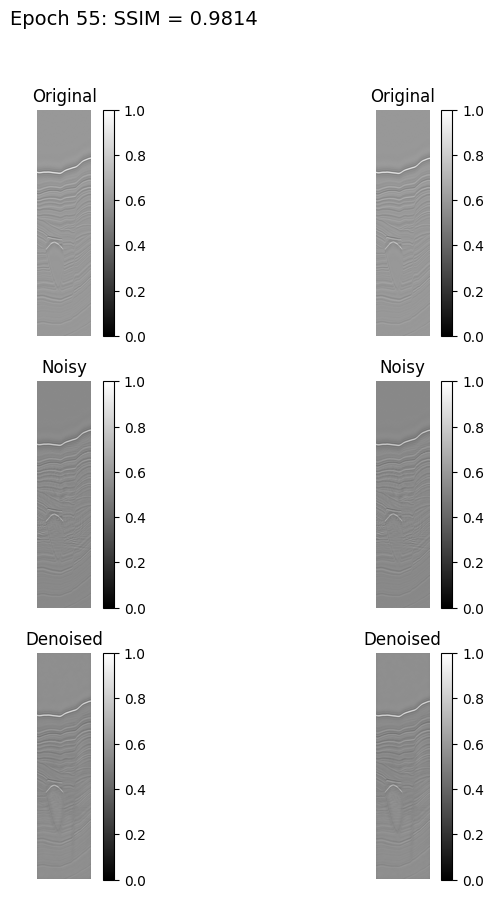

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0103 - val_loss: 0.0177
Epoch 56/70


2025-04-06 04:59:28.130320: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 875 of 1000
2025-04-06 04:59:29.962185: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0111

2025-04-06 05:00:46.785682: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:00:46.785738: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:01:03.228467: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


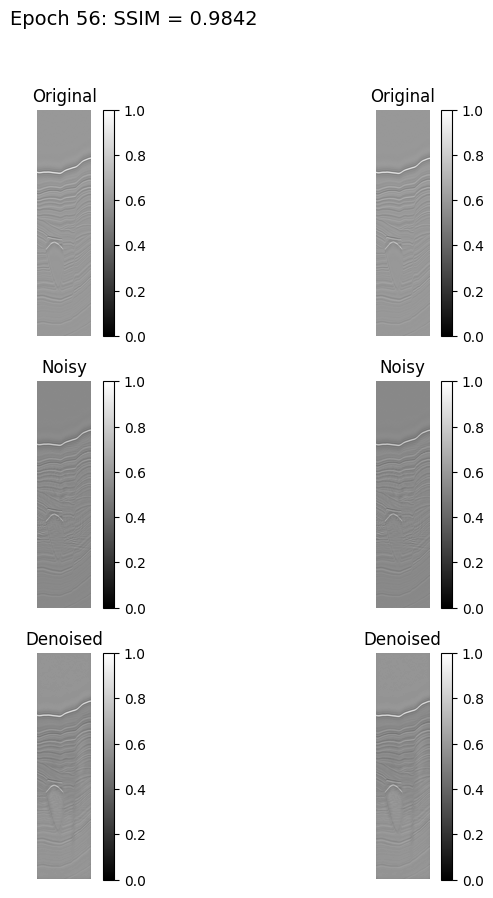

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 885ms/step - loss: 0.0112 - val_loss: 0.0149
Epoch 57/70


2025-04-06 05:01:25.910899: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-06 05:01:27.671156: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0103

2025-04-06 05:02:44.775202: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:02:44.775281: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:03:01.107921: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:03:01.107993: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


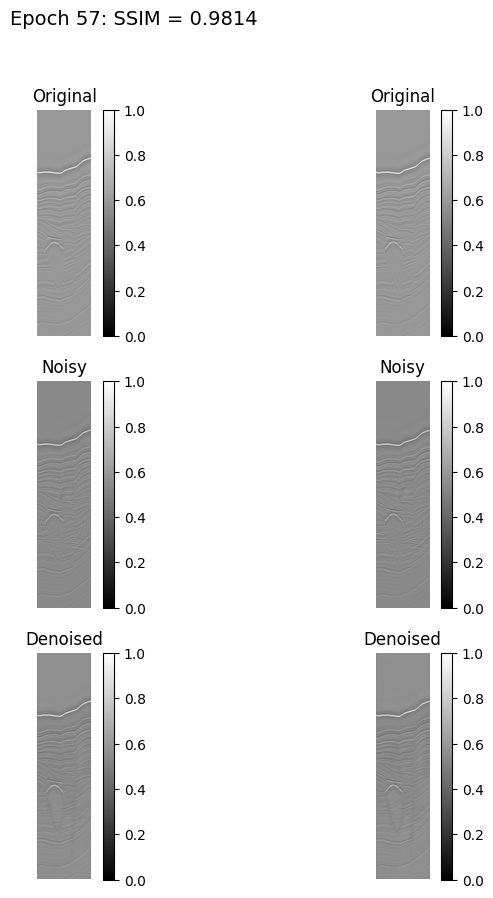

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0103 - val_loss: 0.0175
Epoch 58/70


2025-04-06 05:03:24.051791: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 866 of 1000
2025-04-06 05:03:25.983071: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 654ms/step - loss: 0.0101

2025-04-06 05:04:44.487869: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:04:44.487938: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:05:00.778937: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


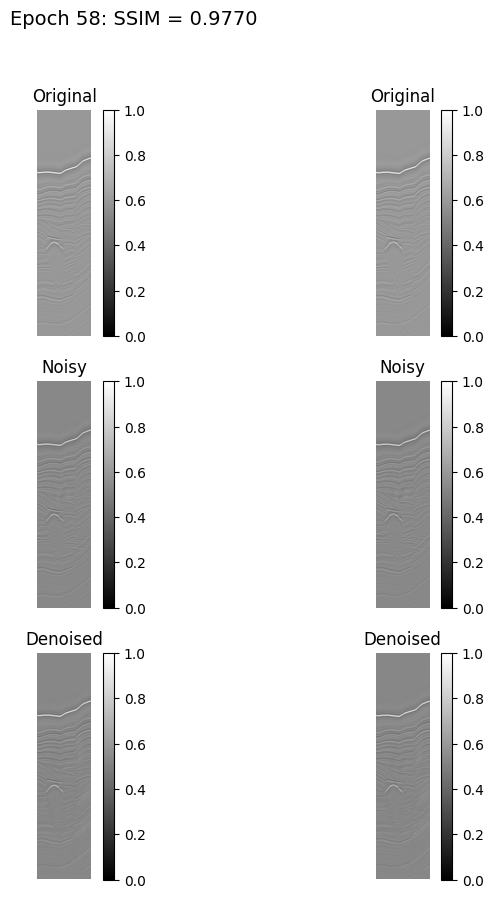

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 900ms/step - loss: 0.0101 - val_loss: 0.0213
Epoch 59/70


2025-04-06 05:05:23.668555: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 862 of 1000
2025-04-06 05:05:25.604155: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0105

2025-04-06 05:06:58.728673: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:06:58.728742: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


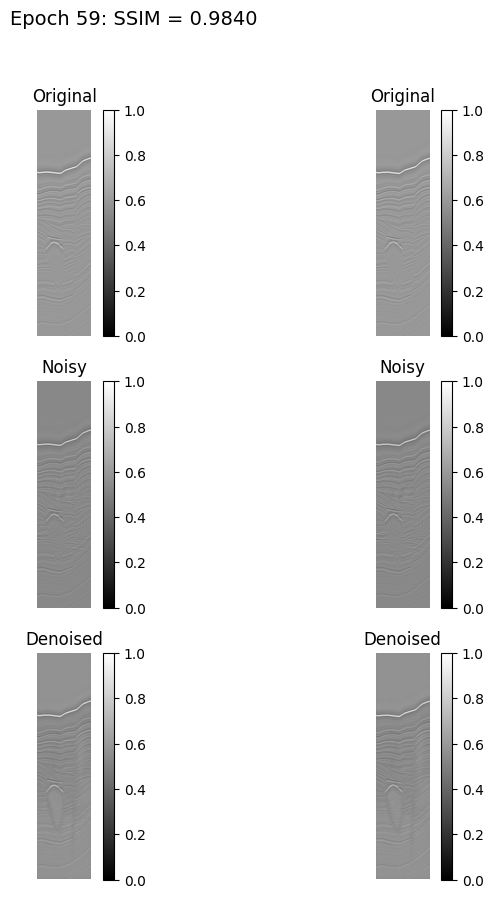

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 884ms/step - loss: 0.0105 - val_loss: 0.0153
Epoch 60/70


2025-04-06 05:07:21.480155: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 859 of 1000
2025-04-06 05:07:23.451851: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0099

2025-04-06 05:08:56.842714: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:08:56.842752: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


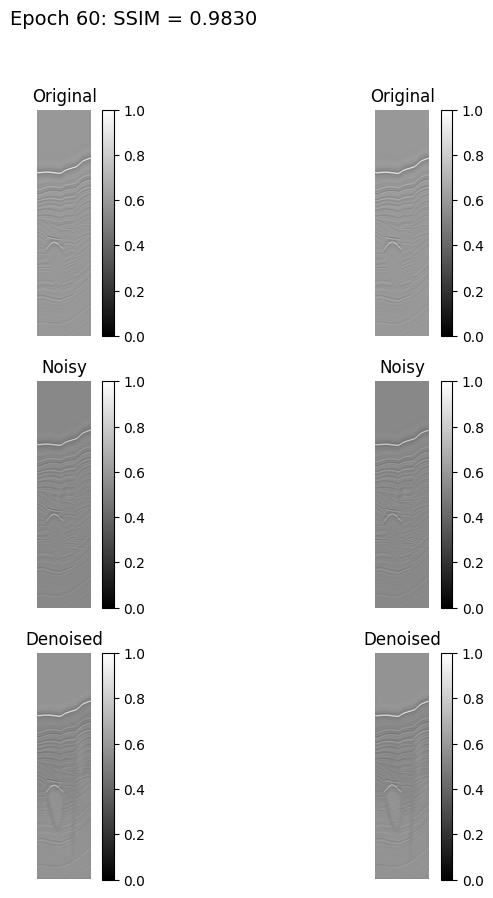

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0099 - val_loss: 0.0158
Epoch 61/70


2025-04-06 05:09:19.600688: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 884 of 1000
2025-04-06 05:09:21.396089: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0101

2025-04-06 05:10:54.838028: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:10:54.838104: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


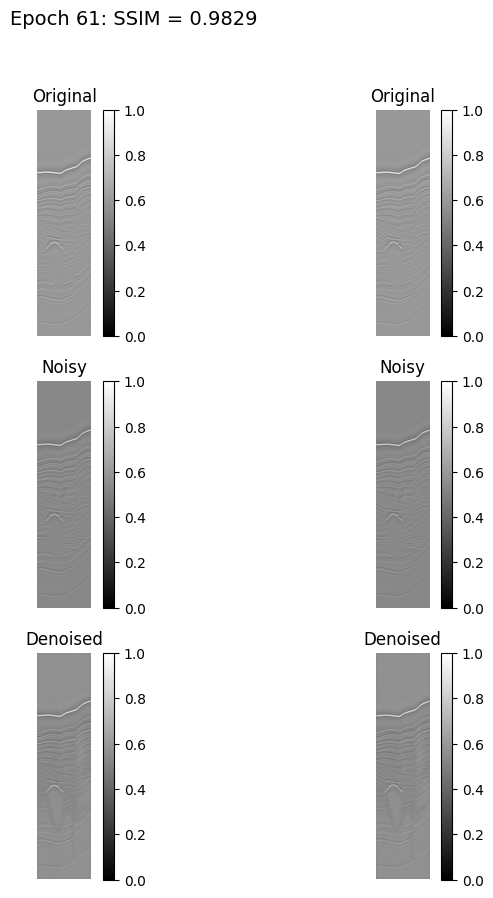

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0101 - val_loss: 0.0162
Epoch 62/70


2025-04-06 05:11:17.666095: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 880 of 1000
2025-04-06 05:11:19.495804: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0099

2025-04-06 05:12:36.437081: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:12:36.437127: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:12:52.799949: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


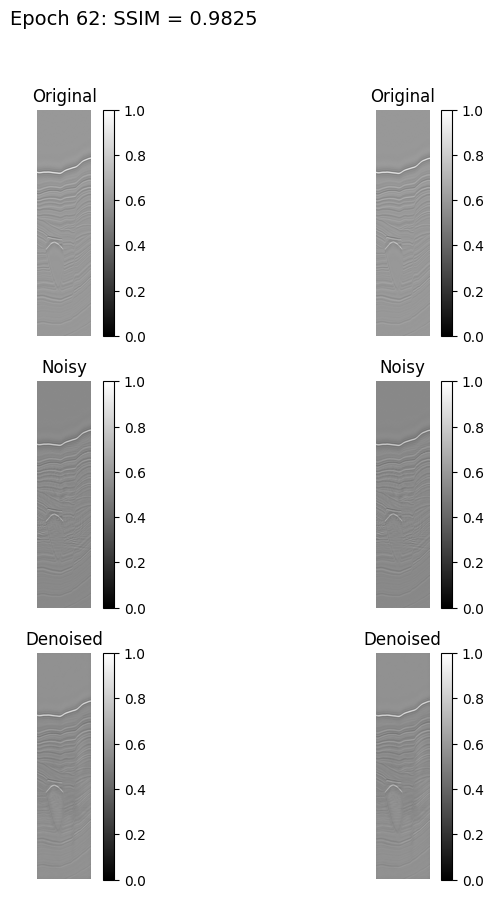

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0099 - val_loss: 0.0162
Epoch 63/70


2025-04-06 05:13:15.844792: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 852 of 1000
2025-04-06 05:13:17.866092: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - loss: 0.0098

2025-04-06 05:14:34.691249: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:14:34.691321: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:14:51.171562: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:14:51.171632: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


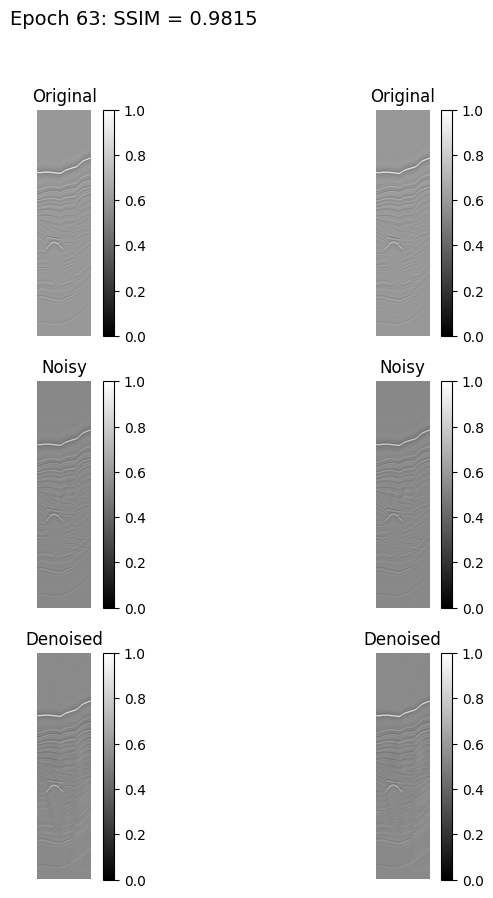

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0098 - val_loss: 0.0182
Epoch 64/70


2025-04-06 05:15:13.951883: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 05:15:15.876218: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - loss: 0.0100

2025-04-06 05:16:34.726302: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:16:34.726378: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:16:51.220769: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:16:51.220849: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


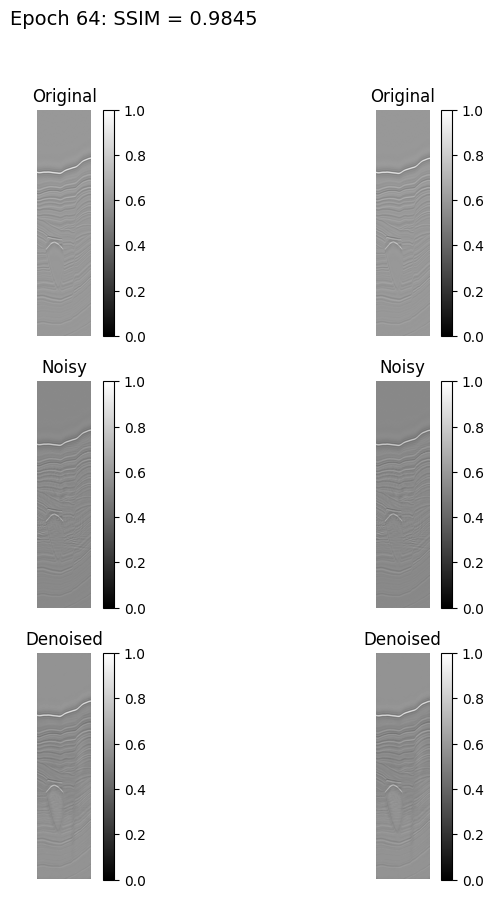

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 905ms/step - loss: 0.0100 - val_loss: 0.0149
Epoch 65/70


2025-04-06 05:17:14.178599: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-06 05:17:15.997889: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - loss: 0.0097

2025-04-06 05:18:33.465136: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:18:33.465212: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:18:49.824804: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:18:49.824896: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


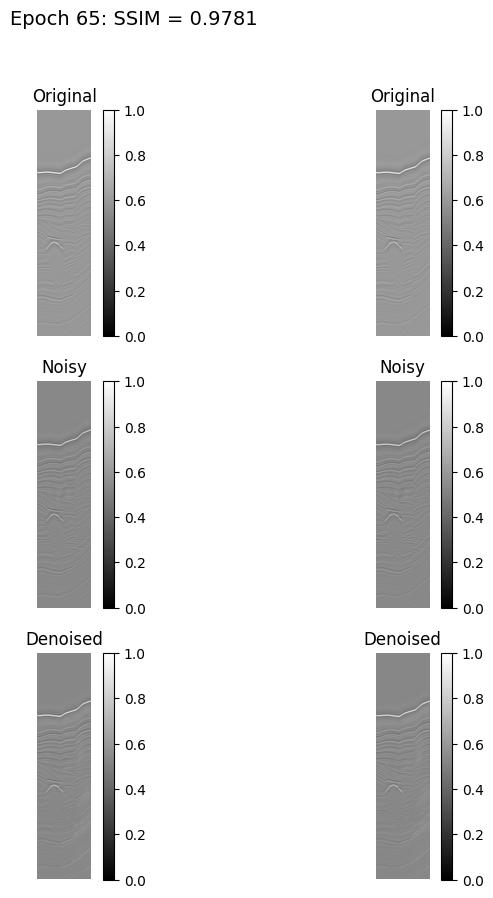

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0097 - val_loss: 0.0208
Epoch 66/70


2025-04-06 05:19:12.447593: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 05:19:14.277935: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0098

2025-04-06 05:20:47.741730: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:20:47.741807: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


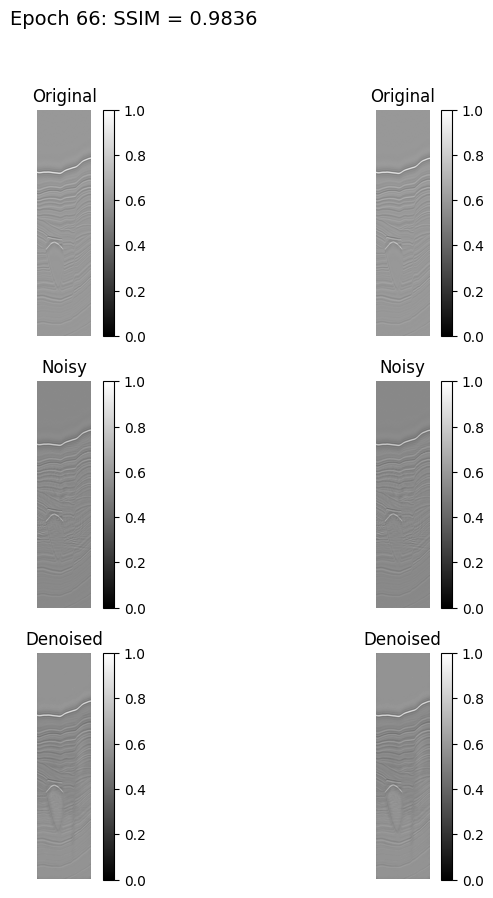

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0098 - val_loss: 0.0156
Epoch 67/70


2025-04-06 05:21:10.637892: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-06 05:21:12.473822: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0094

2025-04-06 05:22:29.682047: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:22:29.682120: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:22:45.985444: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


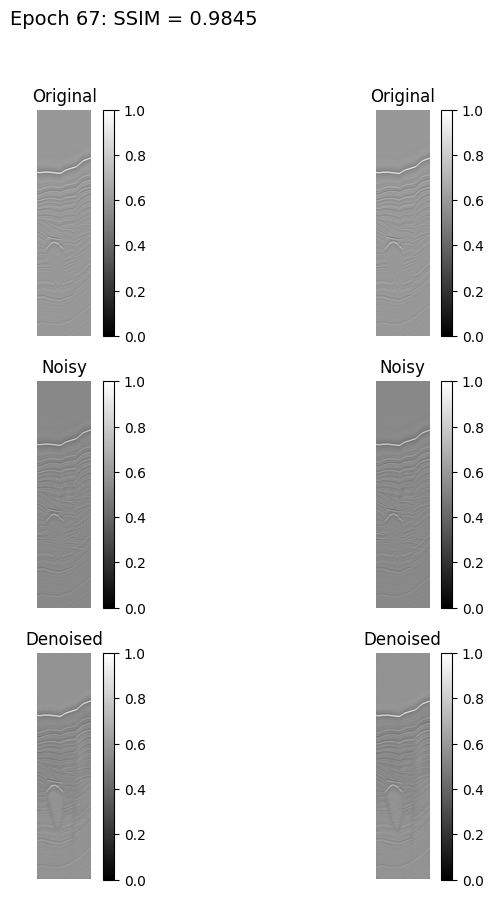

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0094 - val_loss: 0.0150
Epoch 68/70


2025-04-06 05:23:08.904800: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-06 05:23:10.823347: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 656ms/step - loss: 0.0096

2025-04-06 05:24:29.532211: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:24:29.532285: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:24:45.852539: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


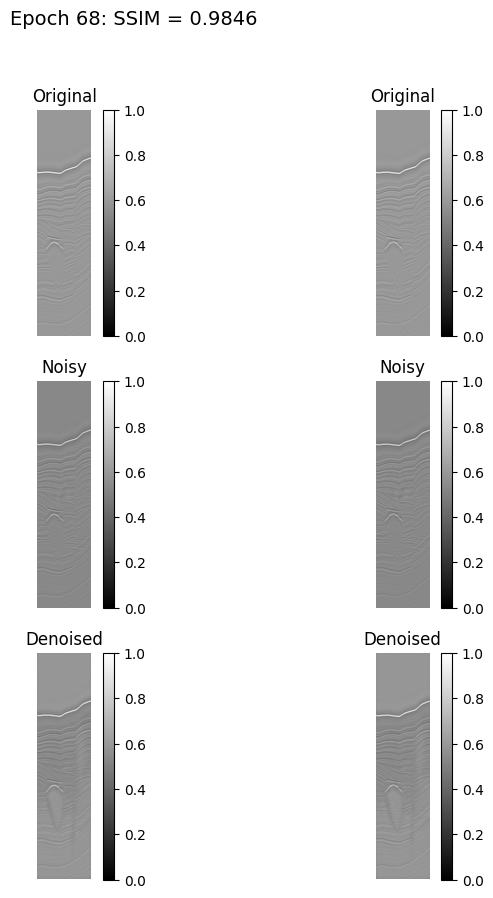

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 900ms/step - loss: 0.0096 - val_loss: 0.0145
Epoch 69/70


2025-04-06 05:25:08.619105: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 872 of 1000
2025-04-06 05:25:10.511940: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 651ms/step - loss: 0.0094

2025-04-06 05:26:28.657918: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:26:28.657996: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:26:45.235027: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


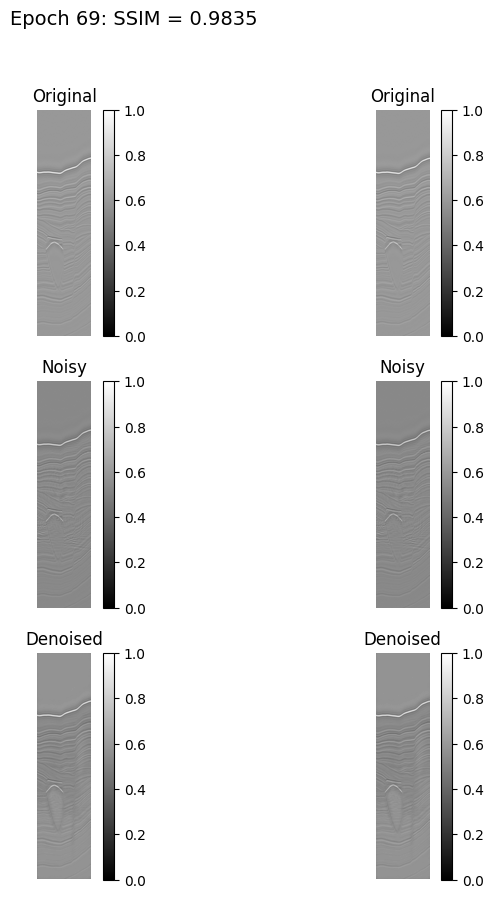

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0094 - val_loss: 0.0156
Epoch 70/70


2025-04-06 05:27:08.000535: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 854 of 1000
2025-04-06 05:27:10.015280: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0094

2025-04-06 05:28:27.248526: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:28:27.248602: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740
2025-04-06 05:28:43.546314: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 11907747150668671736
2025-04-06 05:28:43.546368: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 15677701279088162740


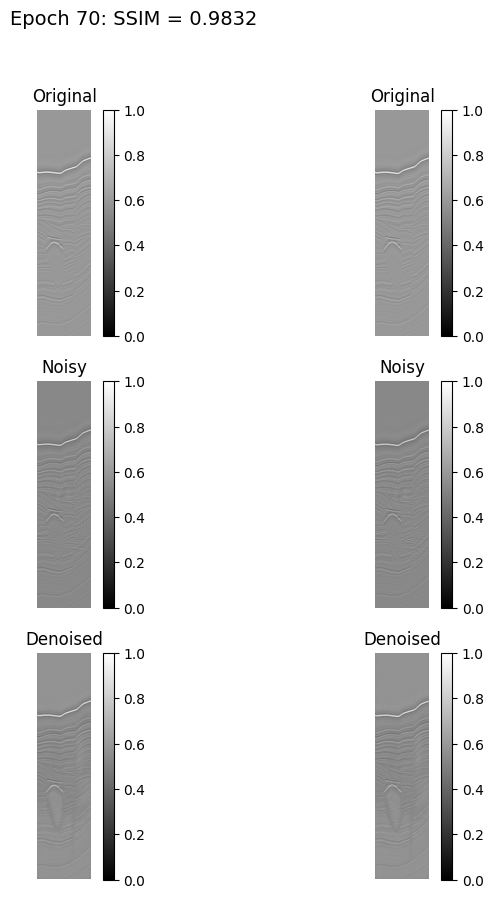

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 891ms/step - loss: 0.0094 - val_loss: 0.0162


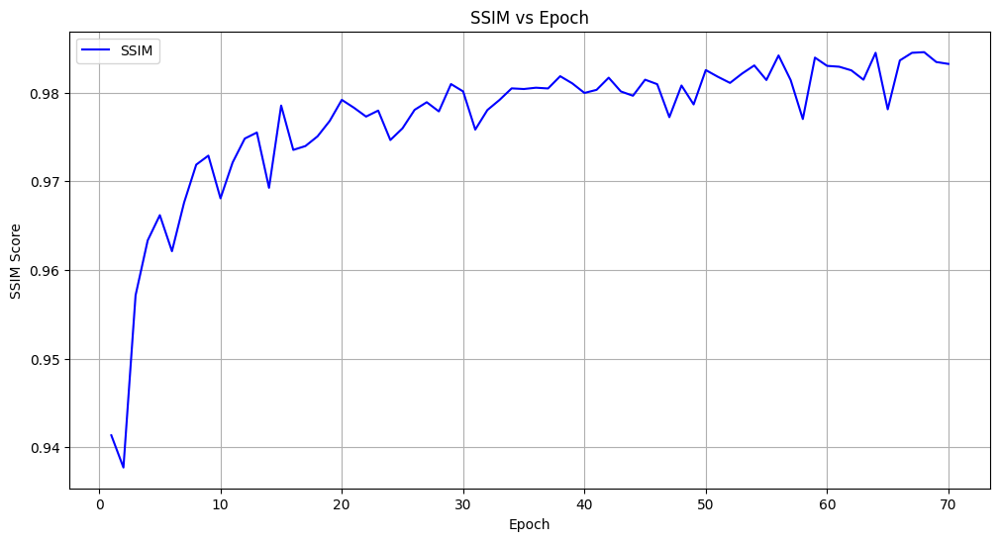

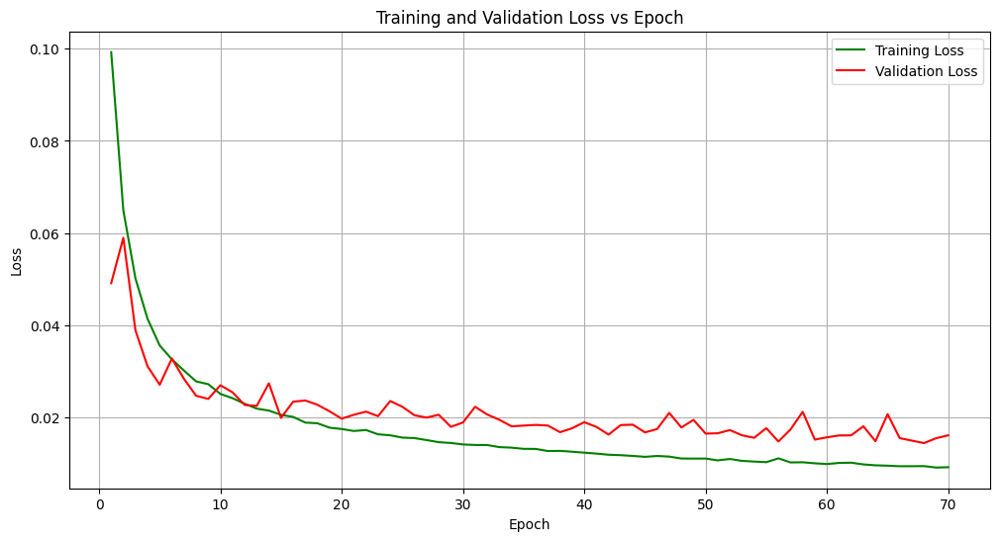

In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.metrics import structural_similarity as ssim
from tensorflow.keras.callbacks import EarlyStopping


# Function to visualize a few pairs of noisy and clean training data

def visualize_training_data(train_dataset, num_pairs=3):
    for noisy_batch, clean_batch in train_dataset.take(1):
        fig, axes = plt.subplots(2, num_pairs, figsize=(8, 10))
        
        for i in range(num_pairs):
            # Noisy image
            im1 = axes[0, i].imshow(noisy_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            axes[0, i].set_title("Noisy", fontsize=12)
            axes[0, i].axis('off')
            fig.colorbar(im1, ax=axes[0, i], fraction=0.046, pad=0.04)  # Add colorbar

            # Clean image
            im2 = axes[1, i].imshow(clean_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            axes[1, i].set_title("Clean", fontsize=12)
            axes[1, i].axis('off')
            fig.colorbar(im2, ax=axes[1, i], fraction=0.046, pad=0.04)  # Add colorbar

        plt.tight_layout()
        plt.show()

# Run the visualization
visualize_training_data(train_dataset, num_pairs=3)

early_stop = EarlyStopping(
    monitor='val_loss',      # Watch validation loss
    patience=5,              # Wait 5 epochs without improvement
    restore_best_weights=True  # Roll back to the best weights
)

# Train the model with the callback
history = autoencoder.fit(
    train_dataset,
    epochs=70,  # Adjust as needed
    validation_data=val_dataset,
    callbacks=[DisplayCallback()]
)
autoencoder.save('seismic_denoising_unet.h5')  # Save to a .h5 file


# Plot training loss, validation loss, and SSIM over epochs
epochs = range(1, len(history.history['loss']) + 1)
plt.figure(figsize=(12, 6))
plt.plot(epochs, history.history['loss'], 'g-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss vs Epoch')
plt.grid(True)
plt.show()


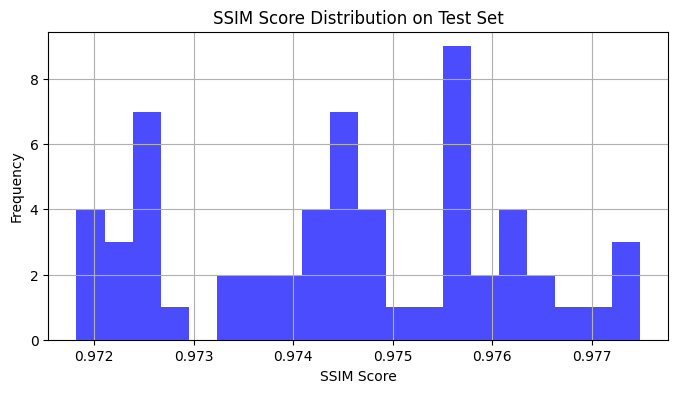

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
import random

# Compute SSIM on test set
test_ssim_scores = []
noisy_images = []
clean_images = []
denoised_images = []

for noisy_batch, clean_batch in test_dataset:
    # Denoise the noisy images using the model
    denoised_imgs = autoencoder.predict(noisy_batch, verbose=0)

    for i in range(len(clean_batch)):
        score = ssim(clean_batch[i].numpy().squeeze(), 
                     denoised_imgs[i].squeeze(), 
                     data_range=1.0)
        test_ssim_scores.append(score)

        # Store images for visualization
        noisy_images.append(noisy_batch[i].numpy().squeeze())   # Noisy Image
        clean_images.append(clean_batch[i].numpy().squeeze())   # Clean Ground Truth
        denoised_images.append(denoised_imgs[i].squeeze())      # Model Output

# SSIM Distribution Plot
plt.figure(figsize=(8, 4))
plt.hist(test_ssim_scores, bins=20, color='b', alpha=0.7)
plt.xlabel('SSIM Score')
plt.ylabel('Frequency')
plt.title('SSIM Score Distribution on Test Set')
plt.grid(True)
plt.show()



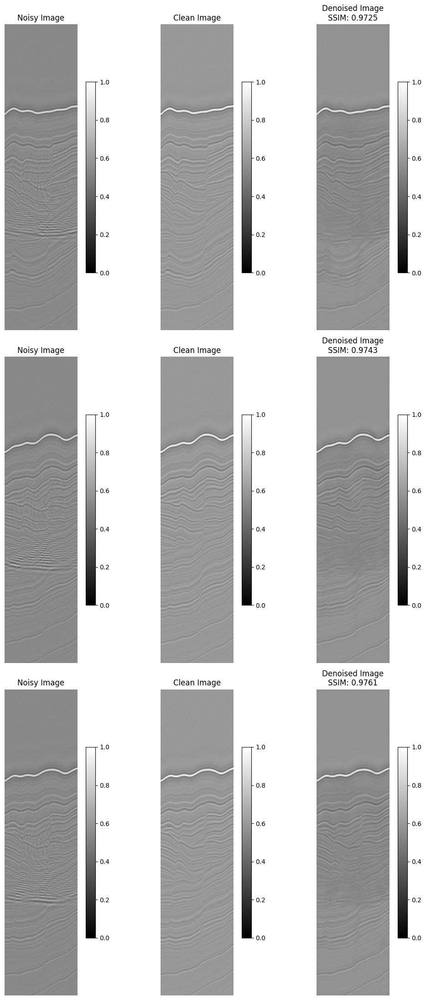

: 

In [ ]:
import matplotlib.pyplot as plt
import random

# Visualize Noisy-Clean-Denoised Triplets
fig, axes = plt.subplots(3, 3, figsize=(12, 22))  # Increased height (18 instead of 14)
random_indices = random.sample(range(len(noisy_images)), 3)

for idx, rand_idx in enumerate(random_indices):
    ssim_score = test_ssim_scores[rand_idx]
    vmin, vmax = 0, 1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image", fontsize=12)
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Clean Image
    im2 = axes[idx, 1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image", fontsize=12)
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

# Make subplots closer
plt.subplots_adjust(hspace=0.25, wspace=0.05)
plt.tight_layout()
plt.show()


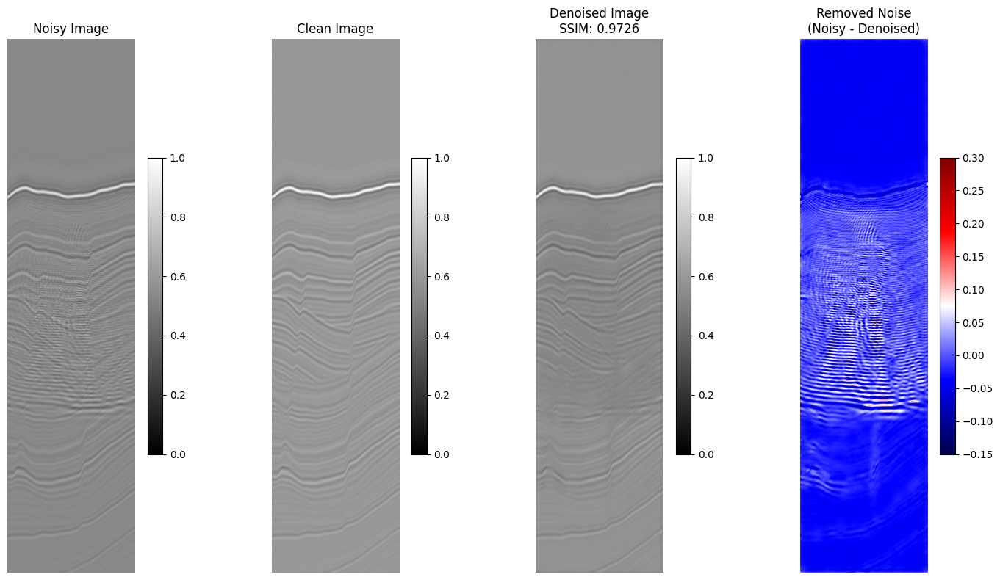

In [45]:
import matplotlib.pyplot as plt
import random

# Choose one random index
rand_idx = random.choice(range(len(noisy_images)))
ssim_score = test_ssim_scores[rand_idx]
vmin, vmax = 0, 1
noise_min, noise_max = -0.15, 0.3  # Adjust depending on dynamic range of noise

# Calculate removed noise
removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

# Create 1x4 subplot
fig, axes = plt.subplots(1, 4, figsize=(16, 8))  # Wider figure

# Noisy Image
im0 = axes[0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title("Noisy Image", fontsize=12)
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Clean Image
im1 = axes[1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title("Clean Image", fontsize=12)
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Denoised Image
im2 = axes[2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

# Removed Noise
im3 = axes[3].imshow(removed_noise.squeeze(), cmap='seismic', vmin=noise_min, vmax=noise_max)
axes[3].set_title("Removed Noise\n(Noisy - Denoised)", fontsize=12)
axes[3].axis('off')
fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

# Adjust spacing
plt.subplots_adjust(wspace=0.05)
plt.tight_layout()
plt.show()


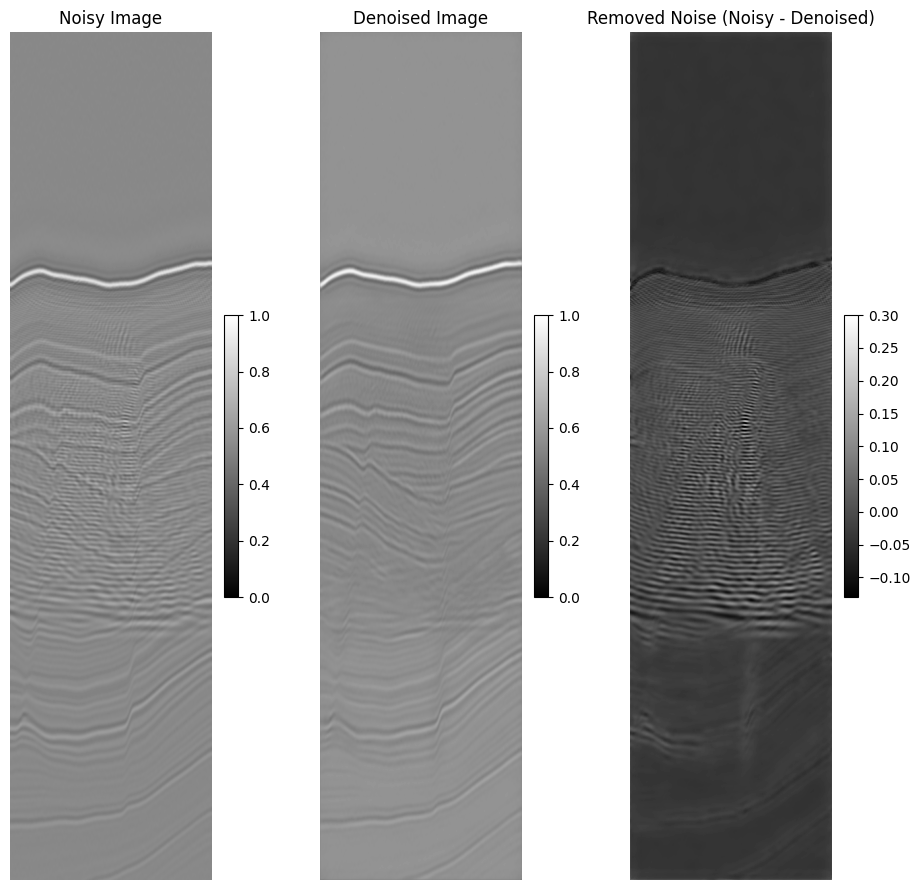

In [48]:
# Select one random index
rand_idx = random.choice(range(len(noisy_images)))

# Compute removed noise = noisy - denoised
removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

# Set consistent color scale
vmin, vmax = 0, 1  # Assuming normalized images

# Plot the triplet
fig, axes = plt.subplots(1, 3, figsize=(10, 9))

# Noisy Image
im0 = axes[0].imshow(noisy_images[rand_idx], cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title("Noisy Image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Denoised Image
im1 = axes[1].imshow(denoised_images[rand_idx], cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title("Denoised Image")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Removed Noise (Difference)
# Optional: you can use a diverging colormap like 'seismic' for better contrast
im2 = axes[2].imshow(removed_noise, cmap='gray', vmin=-0.13, vmax=0.3)
axes[2].set_title("Removed Noise (Noisy - Denoised)")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


In [34]:
# # If these are from the test dataset:
# noisy_images = []
# denoised_images = []
# clean_images = []

# for noisy_batch, clean_batch in test_dataset:
#     denoised_batch = autoencoder.predict(noisy_batch)  # or your model.predict()

#     noisy_images.extend(noisy_batch.numpy())
#     clean_images.extend(clean_batch.numpy())
#     denoised_images.extend(denoised_batch)
# import matplotlib.pyplot as plt
# import random

# num_samples = 4
# random_indices = random.sample(range(len(noisy_images)), num_samples)

# fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

# for idx, rand_idx in enumerate(random_indices):
#     removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

#     vmin, vmax = 0, 1
#     noise_min, noise_max = -0.15, 0.3

#     # Noisy
#     im1 = axes[idx, 0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
#     axes[idx, 0].set_title(f"Noisy #{rand_idx}")
#     axes[idx, 0].axis('off')
#     fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

#     # Denoised
#     im2 = axes[idx, 1].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
#     axes[idx, 1].set_title("Denoised")
#     axes[idx, 1].axis('off')
#     fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

#     # Removed Noise
#     im3 = axes[idx, 2].imshow(removed_noise.squeeze(), cmap='gray', vmin=noise_min, vmax=noise_max)
#     axes[idx, 2].set_title("Removed Noise")
#     axes[idx, 2].axis('off')
#     fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

# plt.tight_layout()
# plt.show()


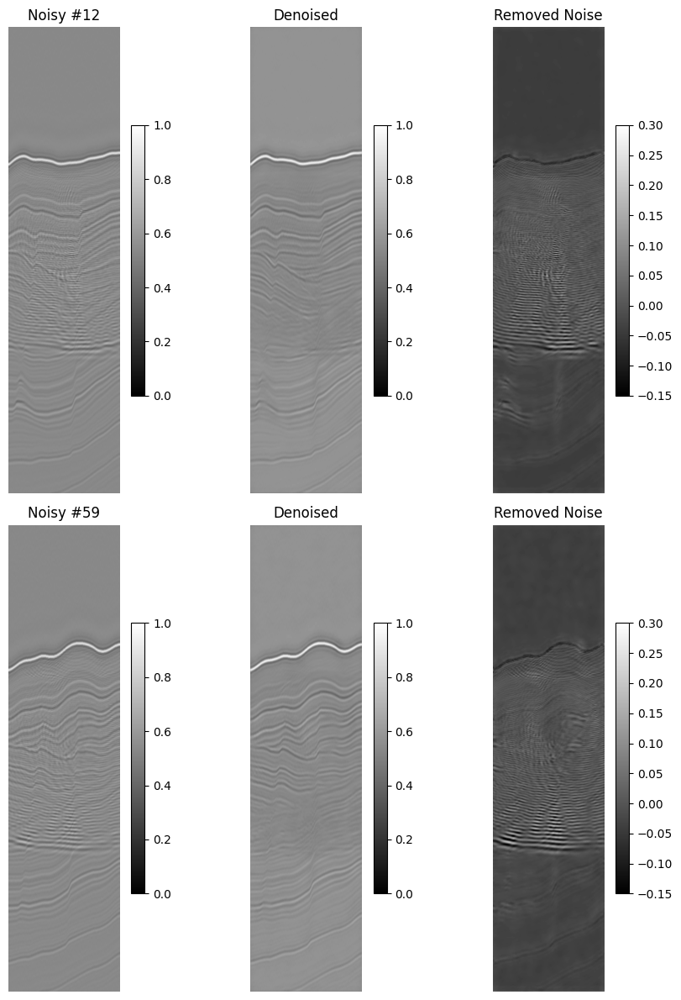

In [38]:
import matplotlib.pyplot as plt

# Example: Choose your own indices from test dataset
chosen_indices = [12, 59]  # Make sure these indices exist in your image list

fig, axes = plt.subplots(len(chosen_indices), 3, figsize=(10, 6 * len(chosen_indices)))

for idx, img_idx in enumerate(chosen_indices):
    removed_noise = noisy_images[img_idx] - denoised_images[img_idx]

    vmin, vmax = 0, 1
    noise_min, noise_max = -0.15, 0.3

    # Noisy
    im1 = axes[idx, 0].imshow(noisy_images[img_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title(f"Noisy #{img_idx}")
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Denoised
    im2 = axes[idx, 1].imshow(denoised_images[img_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Denoised")
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Removed Noise
    im3 = axes[idx, 2].imshow(removed_noise.squeeze(), cmap='gray', vmin=noise_min, vmax=noise_max)
    axes[idx, 2].set_title("Removed Noise")
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


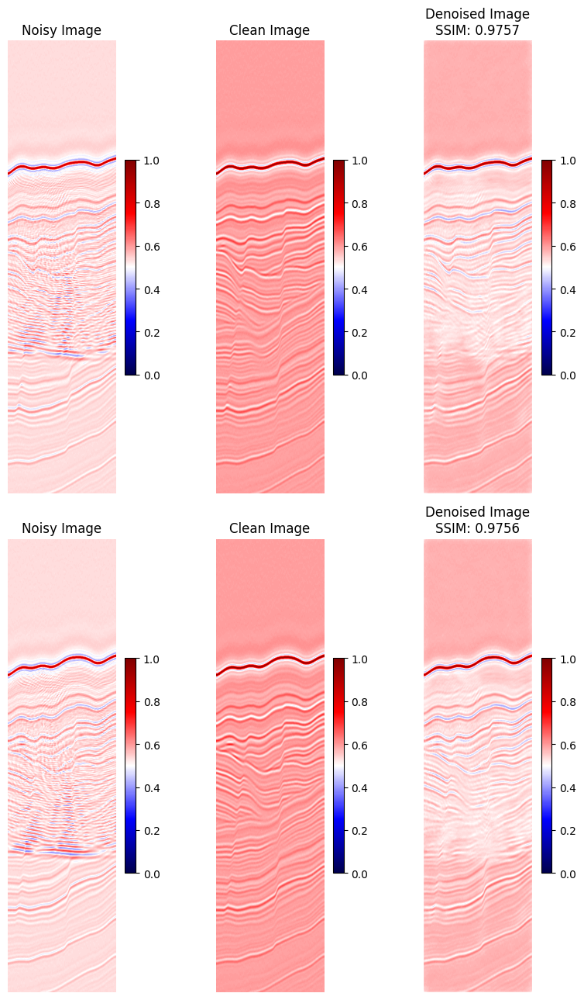

In [50]:
# Visualize Two Random Noisy-Clean-Denoised Image Triplets with Colorbars and SSIM Scores
fig, axes = plt.subplots(2, 3, figsize=(9,13))
random_indices = random.sample(range(len(noisy_images)), 2)

for idx, rand_idx in enumerate(random_indices):
    # SSIM Score for this pair
    ssim_score = test_ssim_scores[rand_idx]  # Fetch the SSIM score for this image
    vmin,vmax=0,1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx], cmap='seismic',vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image")
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)  # Colorbar

    # Clean Image
    
    im2 = axes[idx, 1].imshow(clean_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image")
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)  # Colorbar

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}")  # SSIM displayed in title
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)  # Colorbar

plt.tight_layout()
plt.show()
